In [300]:
%load_ext autoreload
%autoreload 2

if __name__ == '__main__':
    import sys
    import os
    from pathlib import Path
    curr_file_path = Path(os.path.abspath(''))
    print(curr_file_path)
    sys.path.append(str(curr_file_path.parent))
    sys.path.append(os.path.join(str(curr_file_path.parent.parent.parent), 'fixed-point-finder'))

import numpy as np
import glob2 as glob
import matplotlib as mpl
import matplotlib.pyplot as plt
import torch
from torch.distributions.utils import logits_to_probs
from sklearn.decomposition import PCA
from agents.networks.a2c_rnn_split_vanilla import A2CRNN

from plot_utils import plot_fps
from copy import deepcopy as copy
from nb_analysis_tools import load_numpy, load_compressed_data, parse_all_sessions, gen_alignment_chart, find_odor_site_trajectories_by_patch_type
from aux_funcs import compressed_write, logical_and, format_plot, compressed_read, format_pc_plot
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import r2_score
from numpy.linalg import norm
from FixedPointFinderTorch import FixedPointFinderTorch as FixedPointFinder
from plot_utils import plot_fps
from scipy.cluster.hierarchy import linkage, leaves_list
from matplotlib.collections import LineCollection
from matplotlib.colors import Normalize


DATA_BASE_DIR = '../../results/rl_agent_outputs'
PATCH_TYPES_PER_ENV = 3
OBS_SIZE = PATCH_TYPES_PER_ENV + 1
ACTION_SIZE = 2
HIDDEN_SIZE = 128

# SUBNETWORK PARAMS
SUB_HIDDEN_SIZE = 32
SUB_INPUT_SIZE = 2
SUB_OUTPUT_SIZE = 1

plt.rcParams['font.family'] = 'Helvetica Light'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
C:\Users\david.bell\work\favorably_connected\code\notebooks


In [3]:
# Load weights from given `load_path`
def load_network(load_path):
    
    network = A2CRNN(
        input_size=OBS_SIZE + ACTION_SIZE + 1,
        action_size=ACTION_SIZE,
        hidden_size=HIDDEN_SIZE,
        device='cpu',
        var_noise=0,
    )
    
    with torch.no_grad():
        saved_checkpoint = torch.load(os.path.join(DATA_BASE_DIR, load_path).replace('\\','/'), weights_only=False)
        if 'network_state_dict' in saved_checkpoint:
            network.load_state_dict(saved_checkpoint['network_state_dict'])
        else:
            network.load_state_dict(saved_checkpoint)
        network.eval()

    return network


# Load hidden states and behavior of network from `load path`
def load_hidden_and_behavior(load_path):
    data = load_numpy(os.path.join(DATA_BASE_DIR, load_path, 'hidden_state/*.npy').replace('\\','/'))
    data = np.transpose(data, [2, 1, 0])
    
    flattened_data = data.reshape(data.shape[0], data.shape[1] * data.shape[2], order='C')
    
    pca = PCA()
    pc_activities = pca.fit_transform(flattened_data.T)
    pc_activities = pc_activities.T.reshape(data.shape, order='C')
    
    all_session_data = parse_all_sessions(
        os.path.join(DATA_BASE_DIR, load_path, 'state'),
        30,
    )

    return data, pc_activities, all_session_data

In [4]:
weight_paths = [
    'he_init_vanilla_inoise_0p05_2025-07-06_15_02_35_603284_var_noise_0.0001_activity_weight_1/rnn_weights/02550.pth',
]

hidden_and_behavior_paths = [
    'test_he_init_linear_603284_2550_2025-07-09_09_35_34_648819_var_noise_0.0_activity_weight_1',
]

In [5]:
for i, (weight_path, hidden_and_behavior_path) in enumerate(zip(weight_paths, hidden_and_behavior_paths)):
    network = load_network(weight_path)
    # acc_reward_vec_path = os.path.join(DATA_BASE_DIR, Path(weight_path).parents[1], 'stored_pcs_and_weights/rewards_seen_in_patch.pkl').replace('/', '\\')
    # acc_reward_vec = compressed_read(acc_reward_vec_path)
    hidden_activities, pc_activities, all_session_data = load_hidden_and_behavior(hidden_and_behavior_path)

['00000.pkl', '00001.pkl', '00002.pkl', '00003.pkl', '00004.pkl', '00005.pkl', '00006.pkl', '00007.pkl']
00000.pkl
00001.pkl
00002.pkl
00003.pkl
00004.pkl
00005.pkl
00006.pkl
00007.pkl


In [6]:
flattened_ha = hidden_activities.reshape(hidden_activities.shape[0], hidden_activities.shape[1] * hidden_activities.shape[2], order='C')

print(flattened_ha.shape)

pca = PCA()
pc_activities = pca.fit_transform(flattened_ha.T)
pc_activities = pc_activities.T.reshape(hidden_activities.shape, order='C')

(128, 4800000)


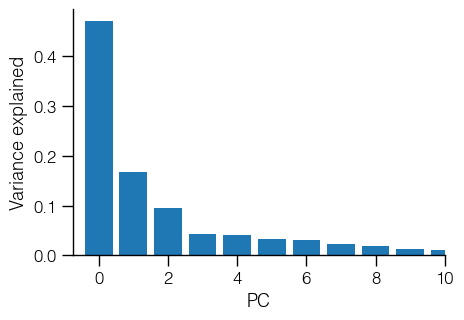

In [7]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

explained_variance_ratios = pca.explained_variance_ratio_
axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')
format_plot(axs)

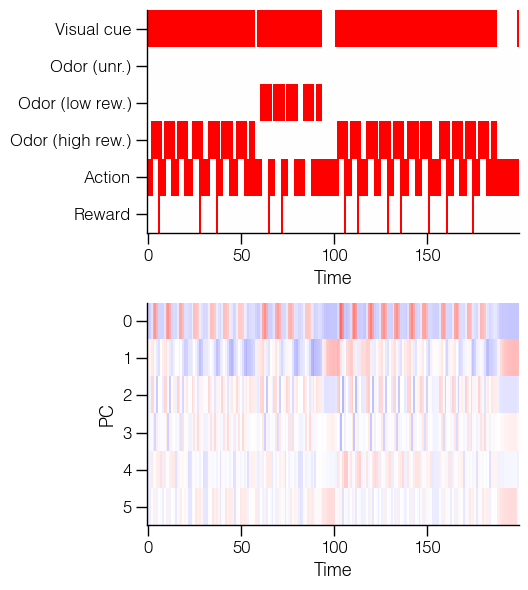

In [8]:
window = slice(1800, 2000)

scale = 1
fig, axs = plt.subplots(2, 1, figsize=(6 * scale, 6 * scale), sharex=True)
axs[1].matshow(pc_activities[:6, 0, window], cmap='bwr', vmin=-1, vmax=1, aspect=20)
axs[1].set_ylabel('PC')
axs[1].set_xlabel('Time')

inputs = np.concatenate([all_session_data[0]['obs'][window, :], all_session_data[0]['action'][window, np.newaxis], all_session_data[0]['reward'][window, np.newaxis]], axis=1).T
axs[0].matshow(inputs, cmap='bwr', vmin=-1, vmax=1, aspect=20)
axs[0].set_yticks(np.arange(6), ['Visual cue', 'Odor (unr.)', 'Odor (low rew.)', 'Odor (high rew.)', 'Action', 'Reward'])
axs[0].set_xlabel('Time')

format_plot(axs)
fig.tight_layout()

In [160]:
def gen_initial_states(inputs):
    n_initial_states = inputs.shape[0]
    flattened_hidden = hidden_activities.reshape(hidden_activities.shape[0], hidden_activities.shape[1] * hidden_activities.shape[2])
    samples = np.zeros(flattened_hidden.shape[1]).astype(bool)
    samples[:n_initial_states] = True
    np.random.shuffle(samples)
    initial_states = flattened_hidden[:, samples].T
    return initial_states


def compute_fixed_points(network, inputs, tol_q=1e-12):
    fpf_hps = {
    		'max_iters': 50000,
    		'lr_init': 1e-3,
            'tol_q': tol_q,
    		'outlier_distance_scale': 10.0,
    		'verbose': False, 
    		'super_verbose': False,
            # 'tol_unique': 1e-3,
    }

    # fpf_hps = {
    # 		'max_iters': 10000,
    # 		'lr_init': 1e-3,
    #         'tol_q': 1e-10,
    # 		'outlier_distance_scale': 10.0,
    # 		'verbose': False, 
    # 		'super_verbose': False,
    #         # 'tol_unique': 1e-3,
    # }
    
    network.rnn.batch_first = True
    fpf = FixedPointFinder(network.rnn, **fpf_hps)
    
    # generate initial states
    initial_states = gen_initial_states(inputs)
    # Run the fixed point finder
    unique_fps, all_fps = fpf.find_fixed_points(copy(initial_states), copy(inputs))
    return unique_fps

In [321]:
def plot_colored_line(x, y, c, ax=None, cmap='viridis', linewidth=2, label=None, colorbar=False, **colorbar_kwargs):
    """
    Plot a line with color varying according to a third array `c`.

    Parameters:
        x, y        : Coordinates of the line.
        c           : Array for coloring the line (same length as x and y).
        ax          : Optional matplotlib Axes to plot on.
        cmap        : Colormap name (default 'viridis').
        linewidth   : Width of the line.
        label       : Optional label for the colorbar.
        colorbar    : Whether to show the colorbar.
        **colorbar_kwargs : Additional kwargs passed to `plt.colorbar`.

    Returns:
        fig, ax     : The Matplotlib Figure and Axes objects.
    """
    x = np.asarray(x)
    y = np.asarray(y)
    c = np.asarray(c)

    assert x.shape == y.shape == c.shape, "x, y, and c must be the same shape"

    # Build segments
    points = np.array([x, y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    # Normalize and create LineCollection
    norm = Normalize(vmin=np.min(c), vmax=np.max(c))
    lc = LineCollection(segments, cmap=cmap, norm=norm, linewidth=linewidth)
    lc.set_array(c[:-1])  # One color per segment

    if ax is None:
        fig, ax = plt.subplots()
    else:
        fig = ax.figure

    ax.add_collection(lc)
    ax.autoscale()

    if colorbar:
        cbar = fig.colorbar(lc, ax=ax, **colorbar_kwargs)
        if label:
            cbar.set_label(label)

    return fig, ax

In [161]:
def run_states_forward(network, inputs, n=100):
    initial_states = gen_initial_states(inputs)
    h = torch.from_numpy(initial_states).float()
    inputs_torch = torch.from_numpy(inputs).float()
    all_h = []
    for i_n in range(n):
        all_h.append(h)
        h = network.rnn(inputs_torch, h)
    return np.stack(all_h)

In [162]:
def plot_eigenvecs_and_vals(unique_fps, env_idx=0):
    scale = 1.2
    fig, axs = plt.subplots(2, 2, figsize=(9 * scale, 7 * scale))

    largest_eigenval_global = np.max(np.real(unique_fps.eigval_J_xstar[:, 0]))
    
    for k in np.arange(0, 8, 2):
        all_mask_off = []
        k_x, k_y = int(k/4), int(k/2) % 2
        
        axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :],
            pc_activities[k+1, env_idx, :],
            s=1,
            zorder=-1,
            c='grey',
            alpha=0.05,
        )
    
        for i in range(unique_fps.xstar.shape[0]):
            fp_pc = pca.transform(unique_fps.xstar[i, :][None, :])
            fp_pc_dim_k = fp_pc[:, k]
            fp_pc_dim_k_plus_1 = fp_pc[:, k+1]
    
            largest_real_part_eigen_val = np.real(unique_fps.eigval_J_xstar[i, 0])
            eig_mag = np.absolute(unique_fps.eigval_J_xstar[i, 0]) * 0.1
    
            cbar = axs[k_x, k_y].scatter(
                [fp_pc_dim_k],
                [fp_pc_dim_k_plus_1],
                c=largest_real_part_eigen_val,
                cmap='cool',
                s=10,
                vmin=0,
                vmax=1.1,
            )
    
        cbar_ax = fig.colorbar(cbar)
        format_plot(cbar_ax.ax, rightspine=False, leftspine=False, topspine=False, bottomspine=False)
        cbar_ax.outline.set_visible(False)
        cbar_ax.set_label('Real part largest eigenvalue', rotation=270, labelpad=20)
    
        # axs[int(k/2)].set_aspect('equal')
    # fig.legend(markerscale=10, bbox_to_anchor=(0.97, 0.99))
    fig.tight_layout()
    format_pc_plot(axs)

In [194]:
def plot_fixed_points_with_q(unique_fps, env_idx=0):
    scale = 1.2
    fig, axs = plt.subplots(2, 2, figsize=(9 * scale, 7 * scale))

    largest_qstar_global = np.max(unique_fps.qstar)
    
    for k in np.arange(0, 8, 2):
        all_mask_off = []
        k_x, k_y = int(k/4), int(k/2) % 2
        
        axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :],
            pc_activities[k+1, env_idx, :],
            s=1,
            zorder=-1,
            c='grey',
            alpha=0.05,
        )
    
        for i in range(unique_fps.xstar.shape[0]):
            fp_pc = pca.transform(unique_fps.xstar[i, :][None, :])
            fp_pc_dim_k = fp_pc[:, k]
            fp_pc_dim_k_plus_1 = fp_pc[:, k+1]
    
            q_star = np.real(unique_fps.qstar[i])
    
            cbar = axs[k_x, k_y].scatter(
                [fp_pc_dim_k],
                [fp_pc_dim_k_plus_1],
                c=q_star,
                cmap='cool',
                s=10,
                vmin=0,
                vmax=largest_qstar_global,
            )
    
        cbar_ax = fig.colorbar(cbar)
        format_plot(cbar_ax.ax, rightspine=False, leftspine=False, topspine=False, bottomspine=False)
        cbar_ax.outline.set_visible(False)
        cbar_ax.set_label('q', rotation=270, labelpad=20)
    
        # axs[int(k/2)].set_aspect('equal')
    # fig.legend(markerscale=10, bbox_to_anchor=(0.97, 0.99))
    fig.tight_layout()
    format_pc_plot(axs)

In [163]:
def plot_eigenval_ratio(unique_fps, env_idx=0):
    scale = 1.2
    fig, axs = plt.subplots(2, 2, figsize=(9 * scale, 7 * scale))
    
    for k in np.arange(0, 8, 2):
        all_mask_off = []
        k_x, k_y = int(k/4), int(k/2) % 2
        
        axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :],
            pc_activities[k+1, env_idx, :],
            s=1,
            zorder=-1,
            c='grey',
            alpha=0.05,
        )
    
        cbar = axs[k_x, k_y].scatter(
            [np.dot(unique_fps.xstar, pca.components_[k, :])],
            [np.dot(unique_fps.xstar, pca.components_[k+1, :])],
            c=np.real(unique_fps.eigval_J_xstar[:, 1]) / np.real(unique_fps.eigval_J_xstar[:, 0]),
            cmap='plasma',
            s=5,
            vmin=0,
            vmax=1,
        )
        
        cbar_ax = fig.colorbar(cbar)
        format_plot(cbar_ax.ax, rightspine=False, leftspine=False, topspine=False, bottomspine=False)
        cbar_ax.outline.set_visible(False)
        cbar_ax.set_label('Ratio real part largest eigenvalues', rotation=270, labelpad=20)
    
        # axs[int(k/2)].set_aspect('equal')
    # fig.legend(markerscale=10, bbox_to_anchor=(0.97, 0.99))
    fig.tight_layout()
    format_pc_plot(axs)

In [323]:
def plot_forward_run_points(h, env_idx=0, in_time=False, scatter=True):
    scale = 1.2
    fig, axs = plt.subplots(2, 2, figsize=(9 * scale, 7 * scale))
    h_final = h[-1, ...]
    h_motion = np.sum(np.sum(np.square(h[-9:, ...] - h[-10:-1, :, ...]), axis=2), axis=0)
    
    for k in np.arange(0, 8, 2):
        all_mask_off = []
        k_x, k_y = int(k/4), int(k/2) % 2
        
        axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :],
            pc_activities[k+1, env_idx, :],
            s=1,
            zorder=-1,
            c='grey',
            alpha=0.05,
        )

        if not in_time:
            for i in range(h_final.shape[0]):
                h_i_pc = pca.transform(h_final[i, :][None, :])
                h_i_dim_k = h_i_pc[:, k]
                h_i_dim_k_plus_1 = h_i_pc[:, k+1]
        
                cbar = axs[k_x, k_y].scatter(
                    [h_i_dim_k],
                    [h_i_dim_k_plus_1],
                    c=h_motion[i],
                    s=10,
                    cmap='plasma',
                    vmin=0,
                    vmax=0.1,
                )
        
            cbar_ax = fig.colorbar(cbar)
            format_plot(cbar_ax.ax, rightspine=False, leftspine=False, topspine=False, bottomspine=False)
            cbar_ax.outline.set_visible(False)
            cbar_ax.set_label('q last 10 steps', rotation=270, labelpad=20)
        else:
            for i in range(h.shape[1]):
                h_i_pc = pca.transform(h[:, i, :])
                h_i_dim_k = h_i_pc[:, k]
                h_i_dim_k_plus_1 = h_i_pc[:, k+1]

                if scatter:
                    cbar = axs[k_x, k_y].scatter(
                        [h_i_dim_k],
                        [h_i_dim_k_plus_1],
                        c=np.arange(h.shape[0]),
                        s=10,
                        cmap='plasma',
                        vmin=0,
                        vmax=h.shape[0],
                    )
                else:
                    plot_colored_line(h_i_dim_k, h_i_dim_k_plus_1, np.arange(h.shape[0]), ax=axs[k_x, k_y], cmap='plasma')
            if scatter:
                cbar_ax = fig.colorbar(cbar)
                format_plot(cbar_ax.ax, rightspine=False, leftspine=False, topspine=False, bottomspine=False)
                cbar_ax.outline.set_visible(False)
                cbar_ax.set_label('Time', rotation=270, labelpad=20)
        
    
        # axs[int(k/2)].set_aspect('equal')
    # fig.legend(markerscale=10, bbox_to_anchor=(0.97, 0.99))
    fig.tight_layout()
    format_pc_plot(axs)

In [218]:
n_initial_states = 200
inputs = np.zeros([n_initial_states, OBS_SIZE + ACTION_SIZE + 1])

unique_fps_baseline = compute_fixed_points(network, inputs, tol_q=5e-3)

	Freezing model parameters so model is not affected by fixed point optimization.
		initial_states: 0 outliers detected (of 200).
		fixed points: 0 outliers detected (of 180).
	Decomposing Jacobians in a single batch.
	Sorting by Eigenvalue magnitude.


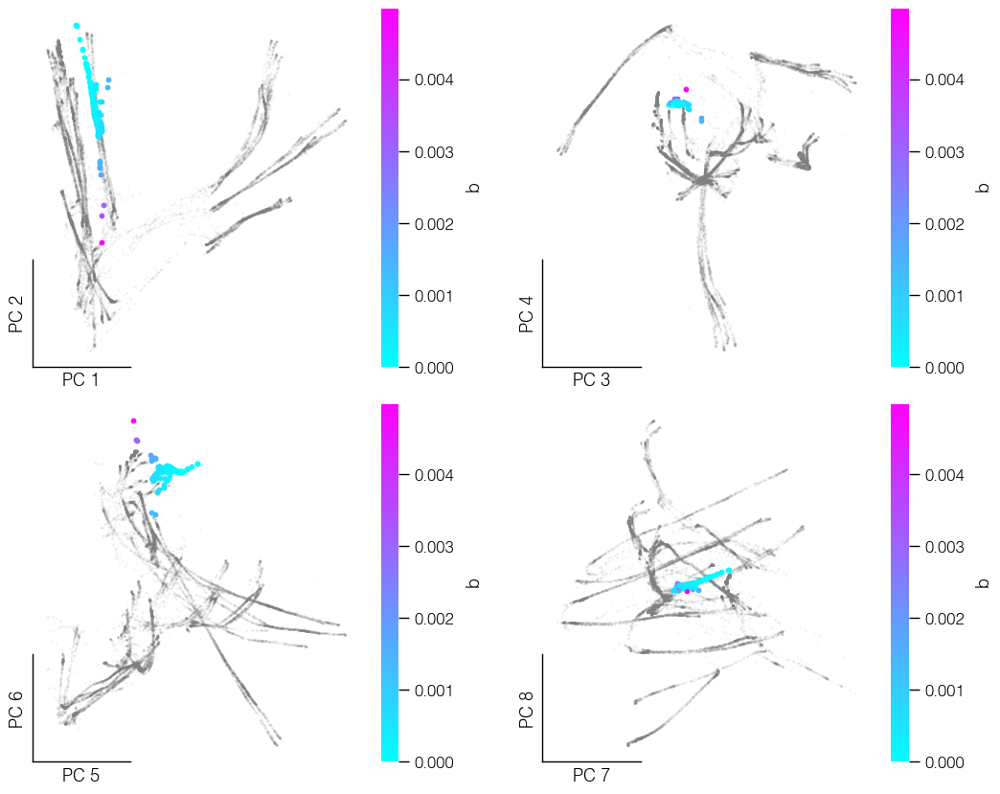

In [219]:
plot_fixed_points_with_q(unique_fps_baseline)

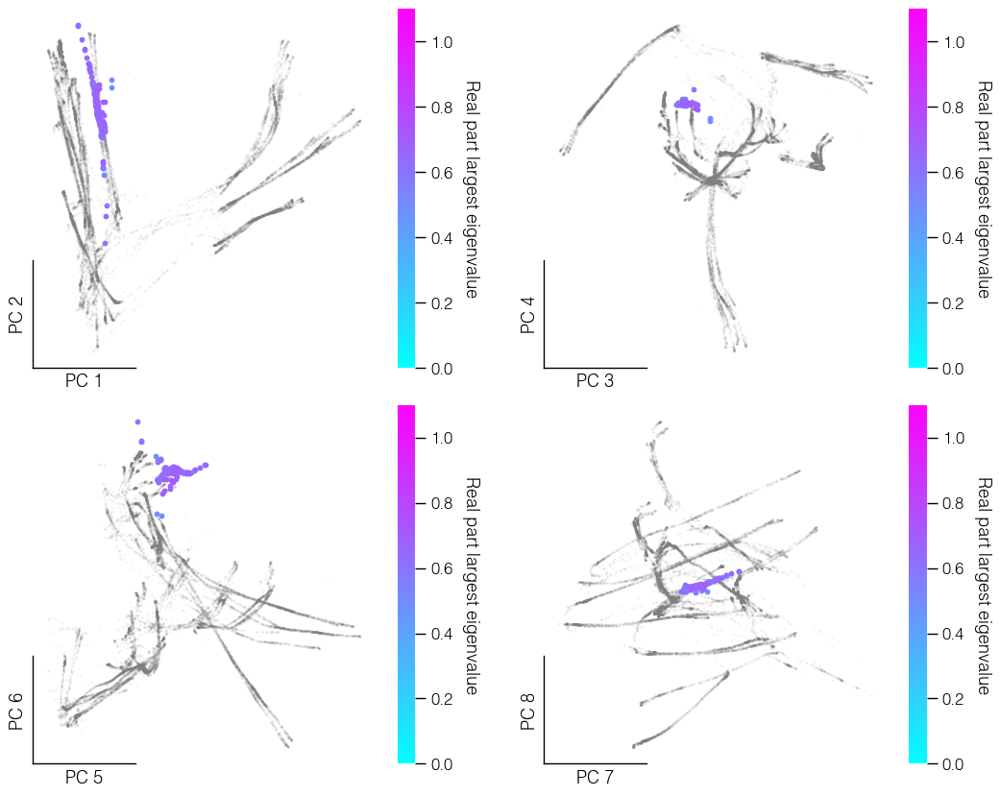

In [220]:
plot_eigenvecs_and_vals(unique_fps_baseline)
# plot_eigenval_ratio(unique_fps_baseline)

In [272]:
n_initial_states = 100
inputs = np.zeros([n_initial_states, OBS_SIZE + ACTION_SIZE + 1])
h_final = run_states_forward(network, inputs, n=100)

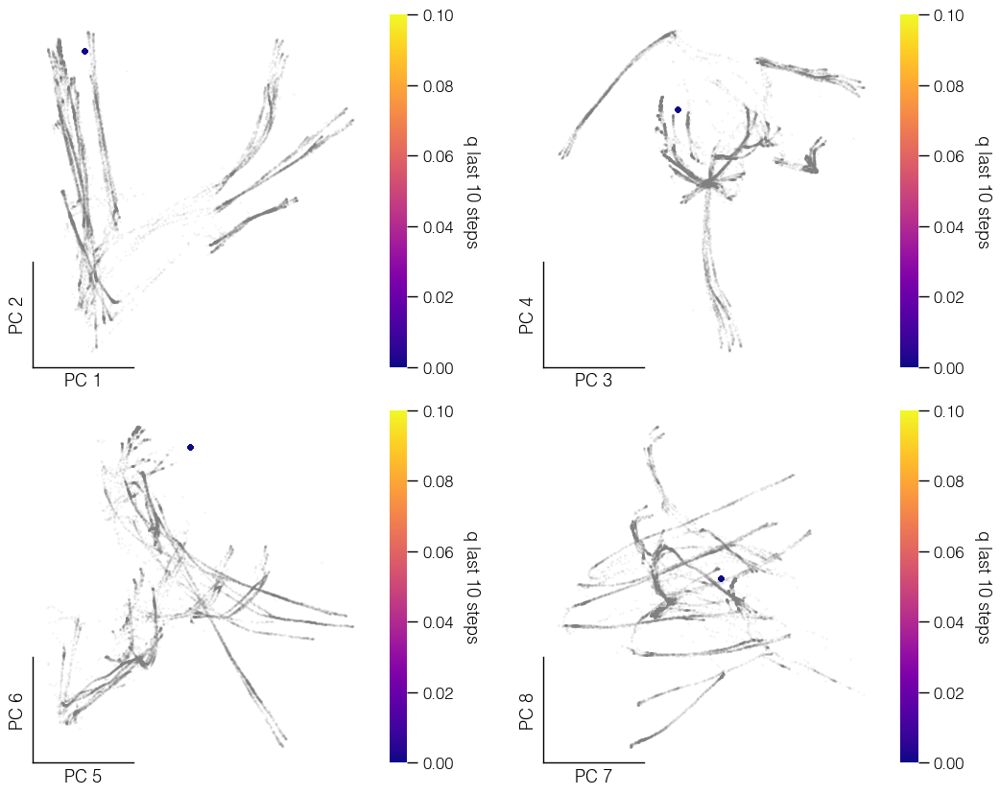

In [273]:
plot_forward_run_points(h_final, env_idx=0)

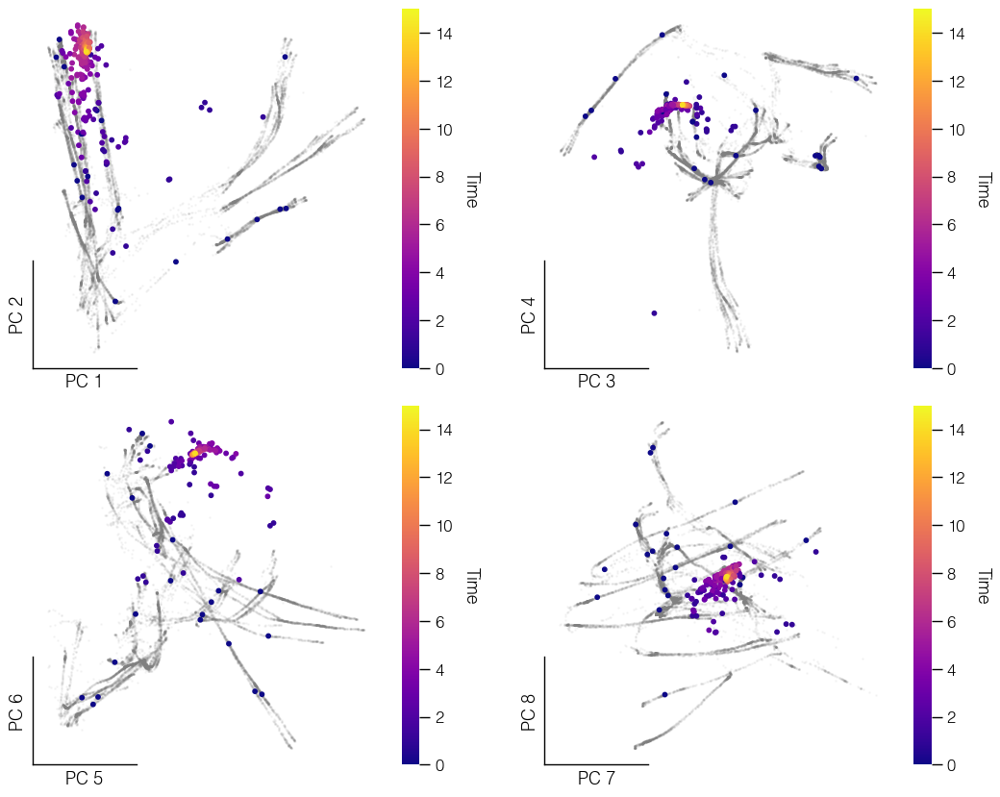

In [275]:
plot_forward_run_points(h_final[:15, :20, :], env_idx=0, in_time=True)

In [221]:
n_initial_states = 200
inputs = np.zeros([n_initial_states, OBS_SIZE + ACTION_SIZE + 1])
inputs[:, 0] = 1

unique_fps_visual_input = compute_fixed_points(network, inputs, tol_q=5e-3)
print(len(unique_fps_visual_input))

	Freezing model parameters so model is not affected by fixed point optimization.
		initial_states: 0 outliers detected (of 200).
		fixed points: 0 outliers detected (of 185).
	Decomposing Jacobians in a single batch.
	Sorting by Eigenvalue magnitude.
185


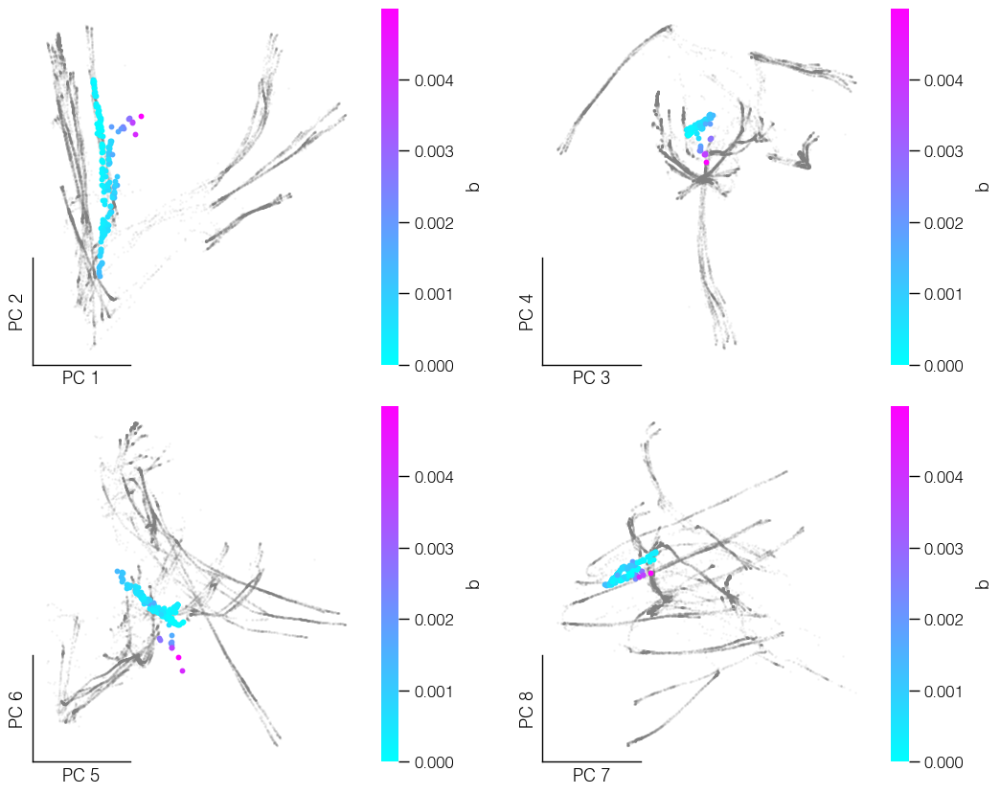

In [222]:
plot_fixed_points_with_q(unique_fps_visual_input)

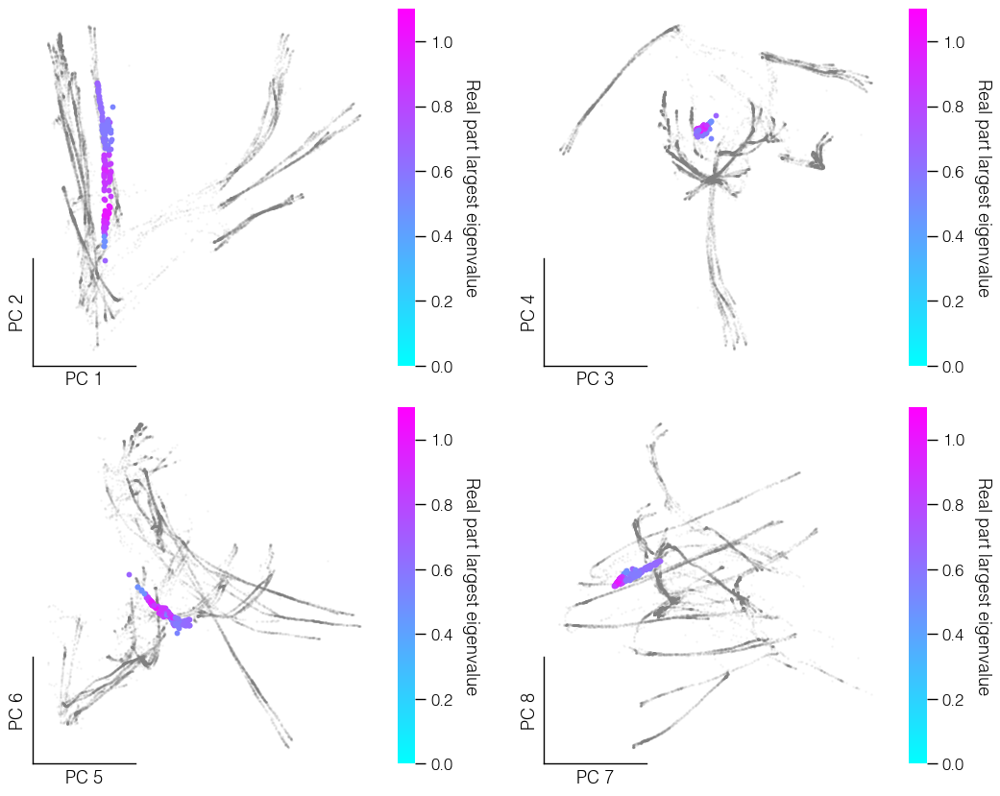

In [206]:
plot_eigenvecs_and_vals(unique_fps_visual_input)
# plot_eigenval_ratio(unique_fps_visual_input)

In [291]:
n_initial_states = 200
inputs = np.zeros([n_initial_states, OBS_SIZE + ACTION_SIZE + 1])
inputs[:, 0] = 1
h_final = run_states_forward(network, inputs, n=100)

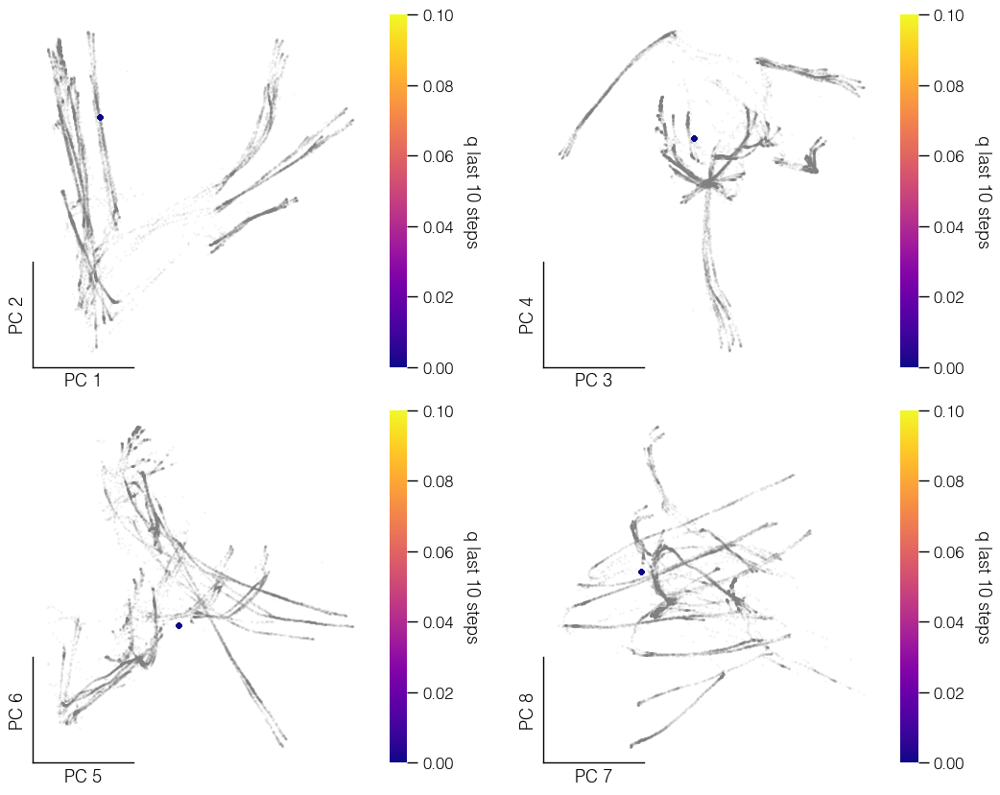

In [292]:
plot_forward_run_points(h_final, env_idx=0, in_time=False)

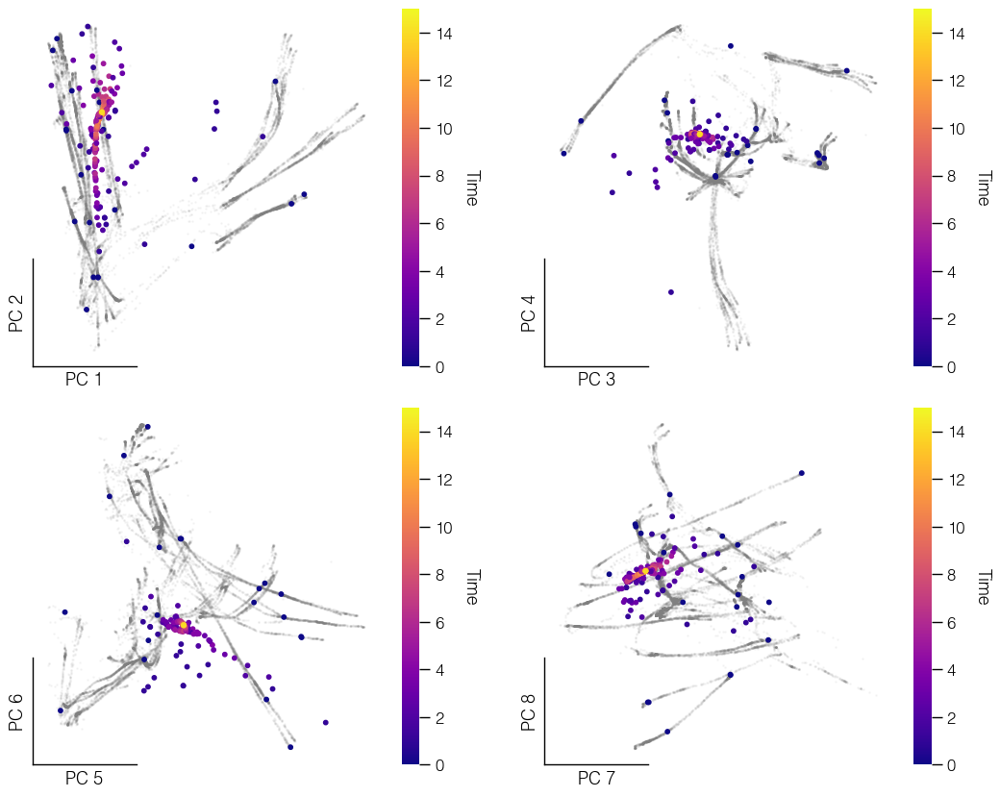

In [278]:
plot_forward_run_points(h_final[:15, :20, :], env_idx=0, in_time=True)

In [201]:
inputs = np.zeros([n_initial_states, OBS_SIZE + ACTION_SIZE + 1])
inputs[:, 0] = 1
inputs[:, 2] = 1

unique_fps_low_reward_odor = compute_fixed_points(network, inputs, tol_q=1e-3)

	Freezing model parameters so model is not affected by fixed point optimization.
		initial_states: 0 outliers detected (of 200).
		fixed points: 0 outliers detected (of 61).
	Decomposing Jacobians in a single batch.
	Sorting by Eigenvalue magnitude.


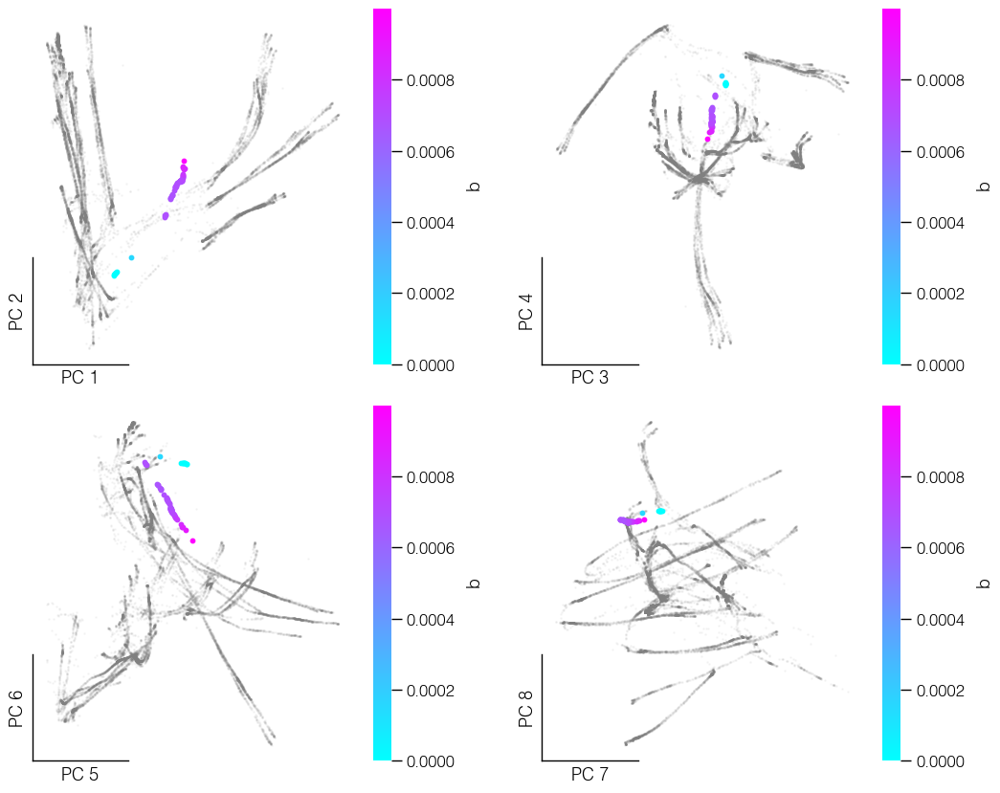

In [202]:
plot_fixed_points_with_q(unique_fps_low_reward_odor)

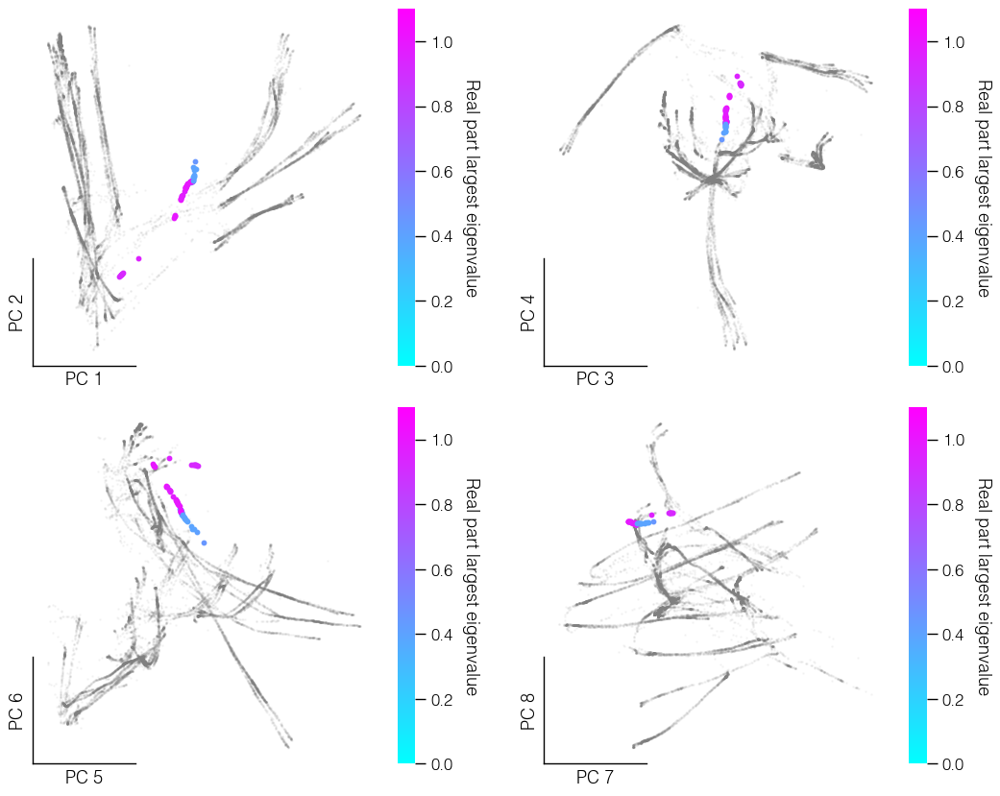

In [203]:
plot_eigenvecs_and_vals(unique_fps_low_reward_odor)
# plot_eigenval_ratio(unique_fps_low_reward_odor)

In [311]:
n_initial_states = 200
inputs = np.zeros([n_initial_states, OBS_SIZE + ACTION_SIZE + 1])
inputs[:, 0] = 1
inputs[:, 2] = 1
h_final = run_states_forward(network, inputs, n=100)

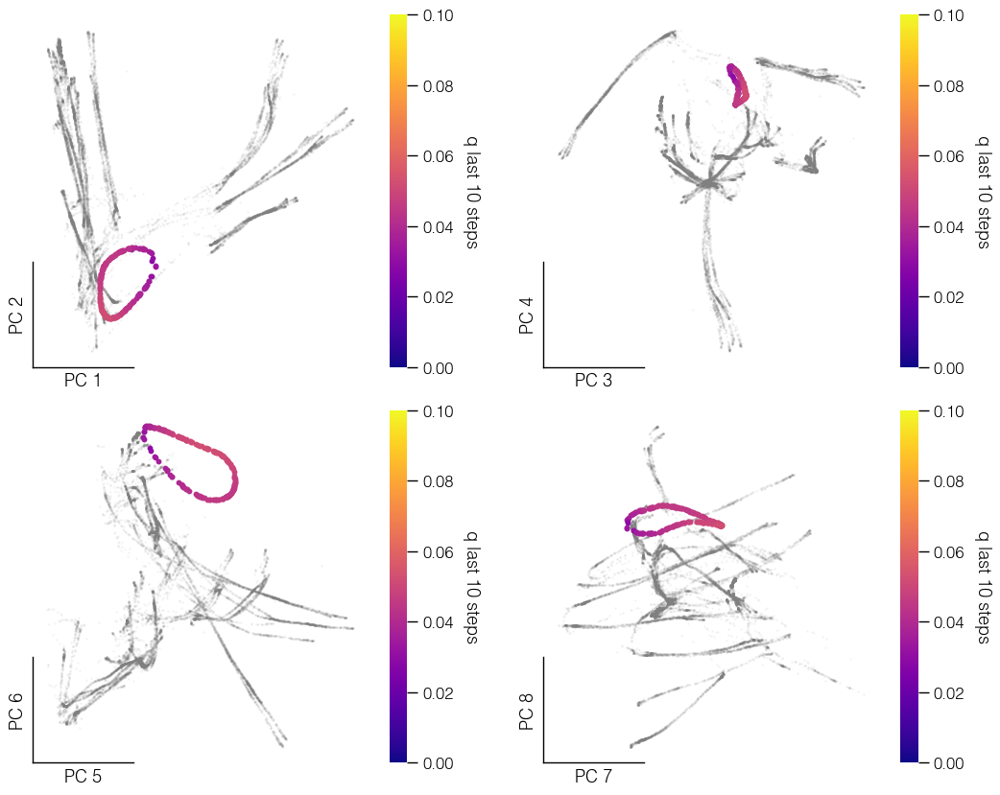

In [155]:
plot_forward_run_points(h_final, env_idx=0)

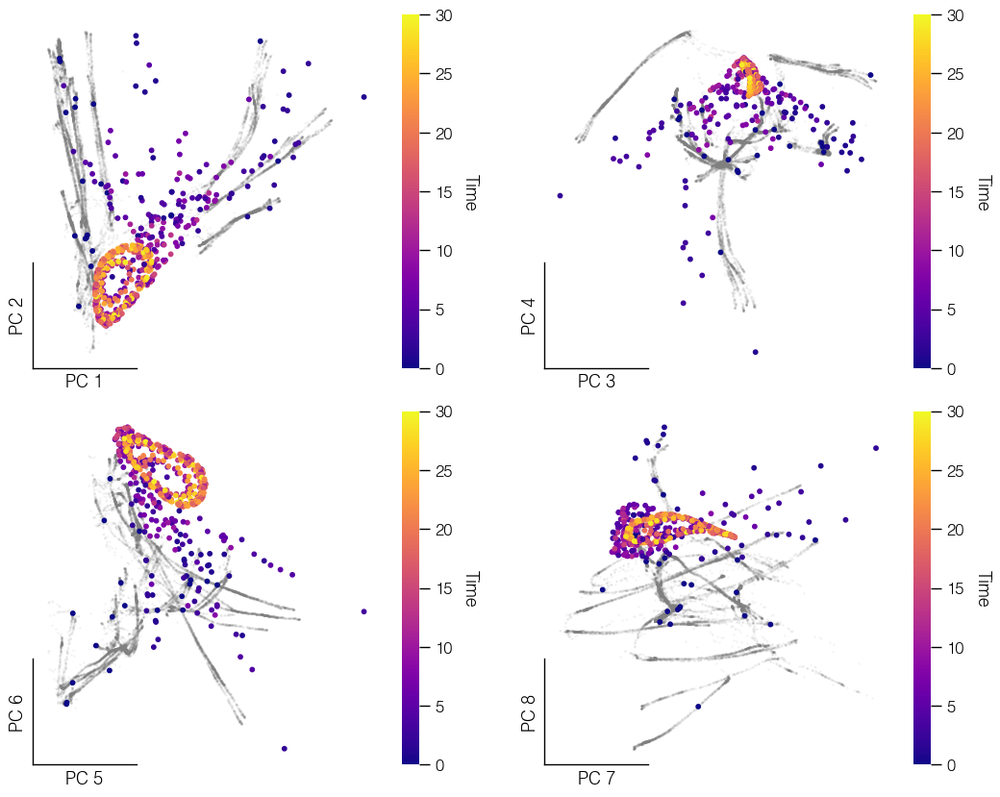

In [281]:
plot_forward_run_points(h_final[:30, :20, :], env_idx=0, in_time=True)

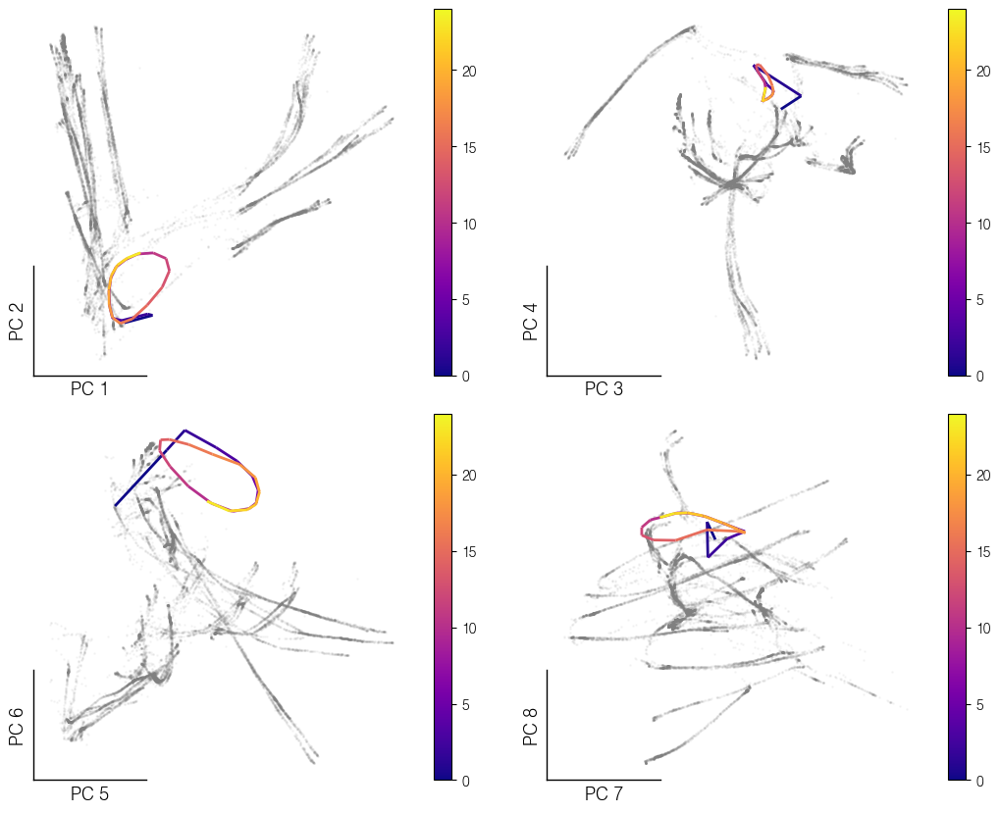

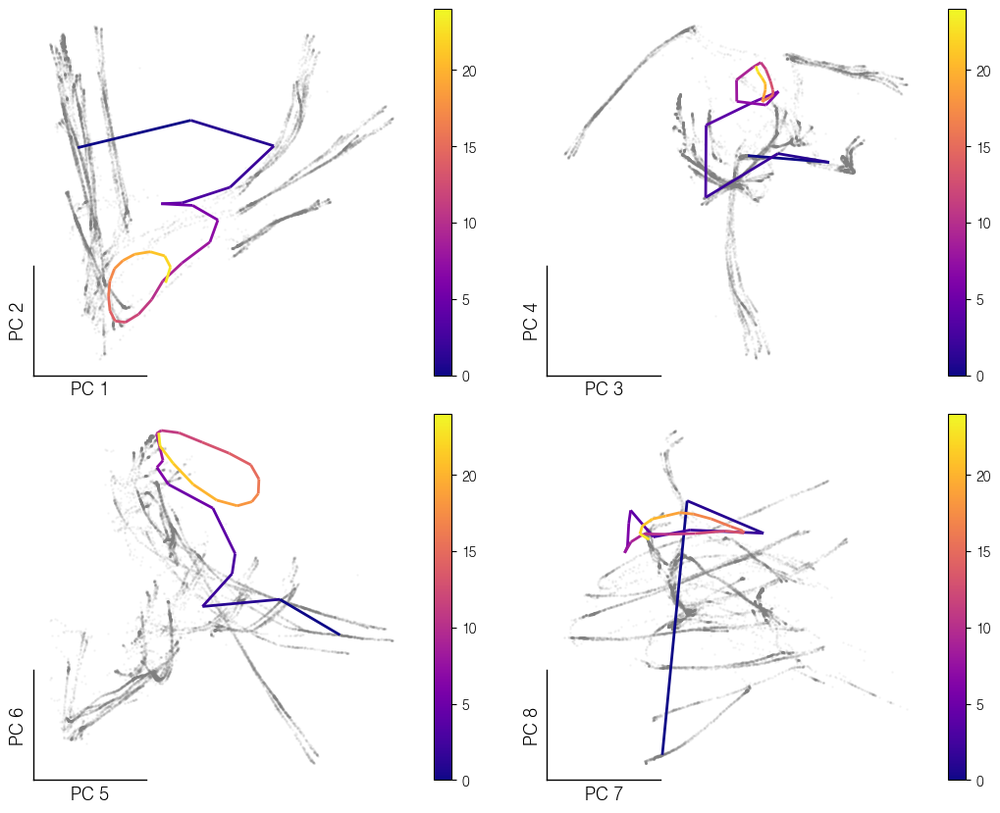

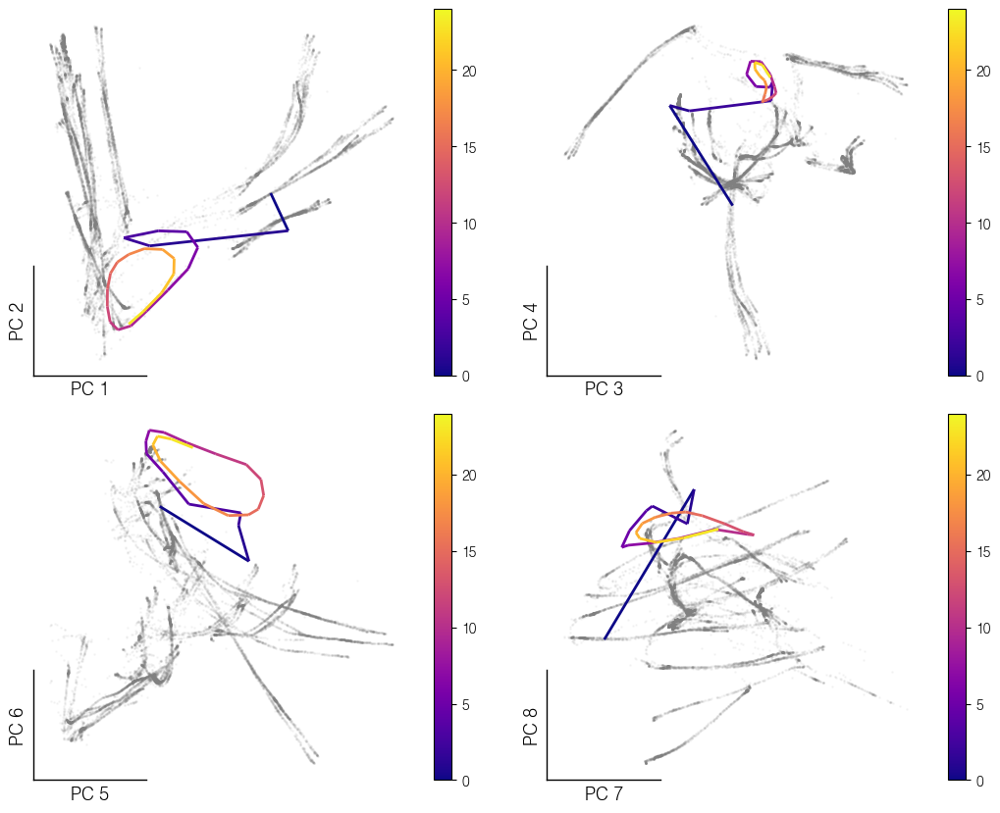

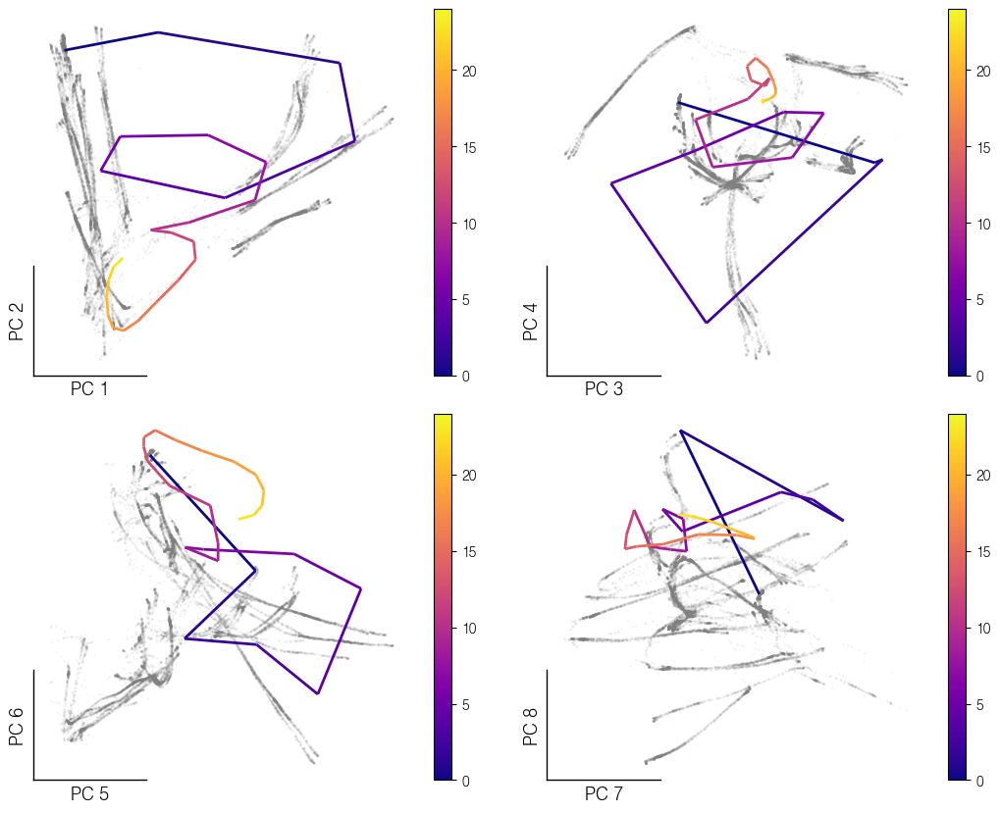

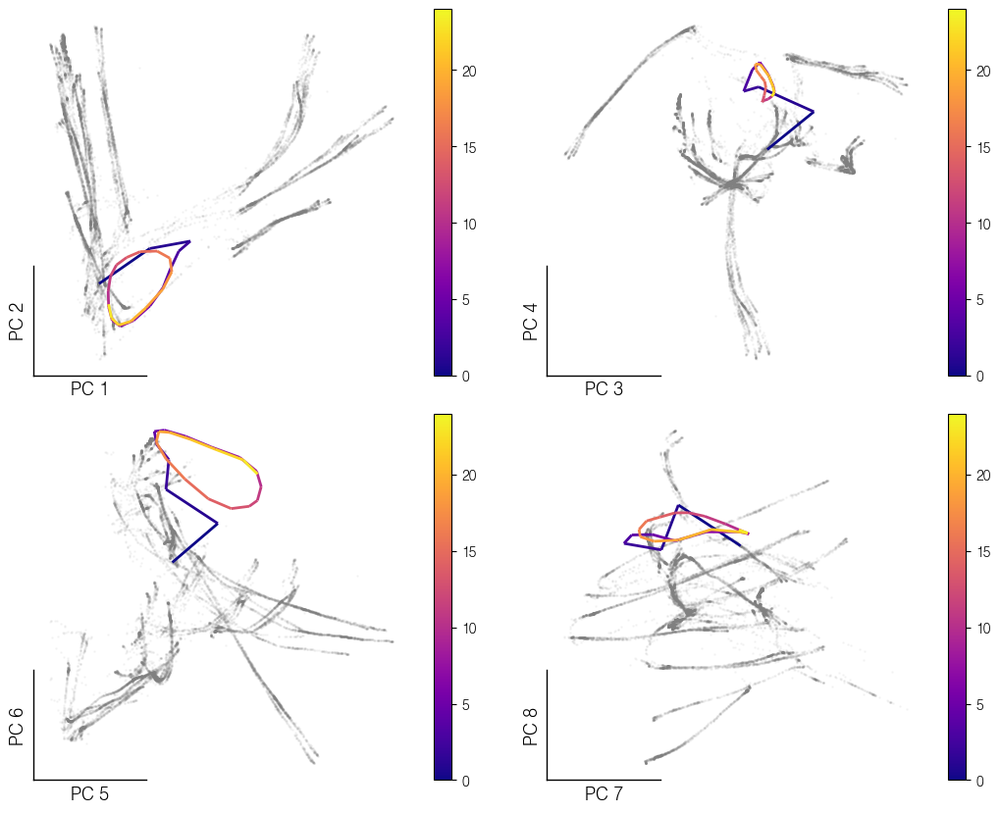

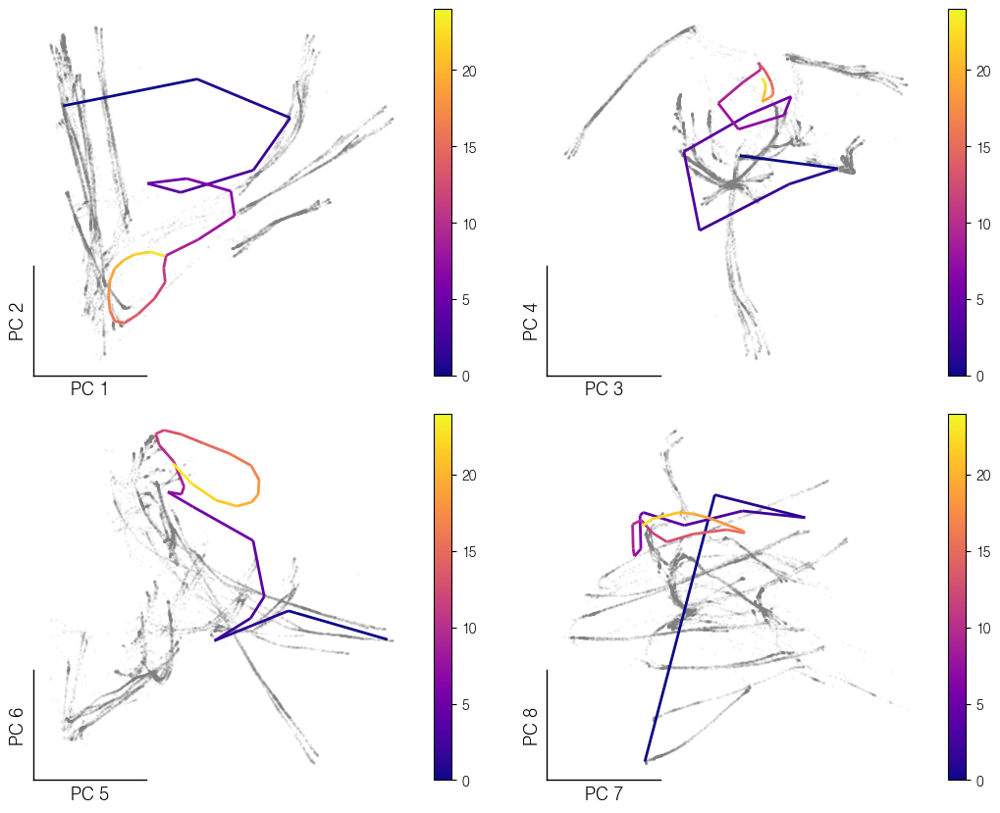

In [313]:
for j in np.arange(0, 6):
    plot_forward_run_points(h_final[:25, j, :][:, None, :], env_idx=0, in_time=True, scatter=False)

In [226]:
inputs = np.zeros([n_initial_states, OBS_SIZE + ACTION_SIZE + 1])
inputs[:, 0] = 1
inputs[:, 3] = 1

unique_fps_high_reward_odor = compute_fixed_points(network, inputs, tol_q=1e-3)

	Freezing model parameters so model is not affected by fixed point optimization.
		initial_states: 0 outliers detected (of 200).
		fixed points: 0 outliers detected (of 138).
	Decomposing Jacobians in a single batch.
	Sorting by Eigenvalue magnitude.


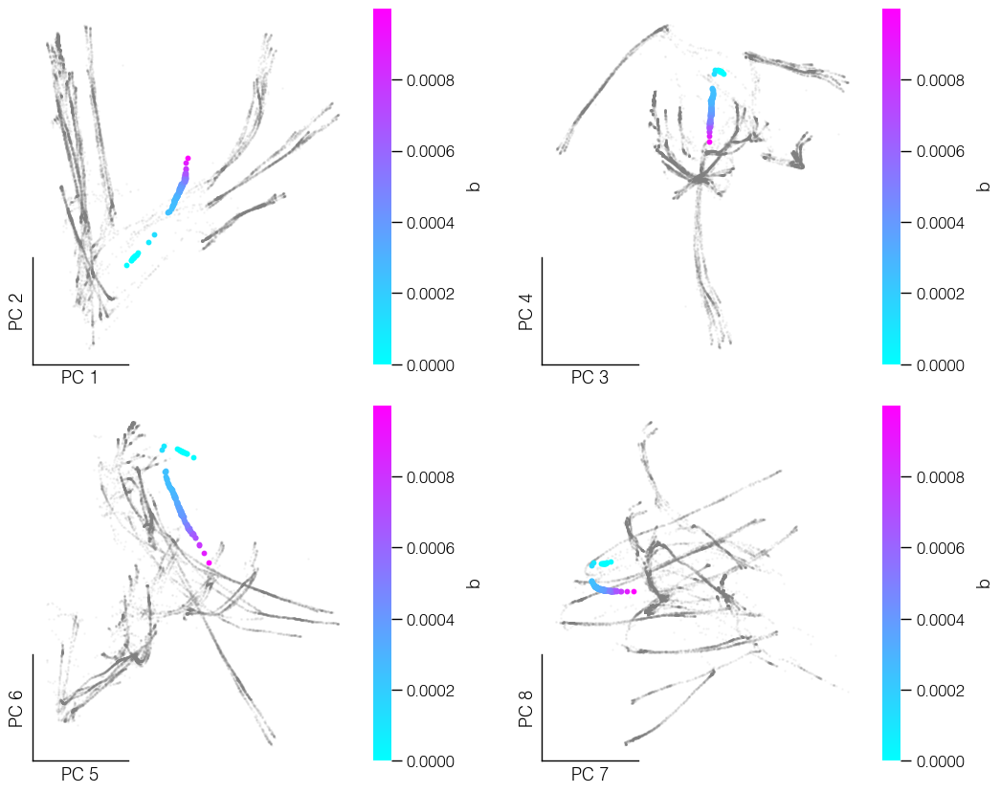

In [228]:
plot_fixed_points_with_q(unique_fps_high_reward_odor)

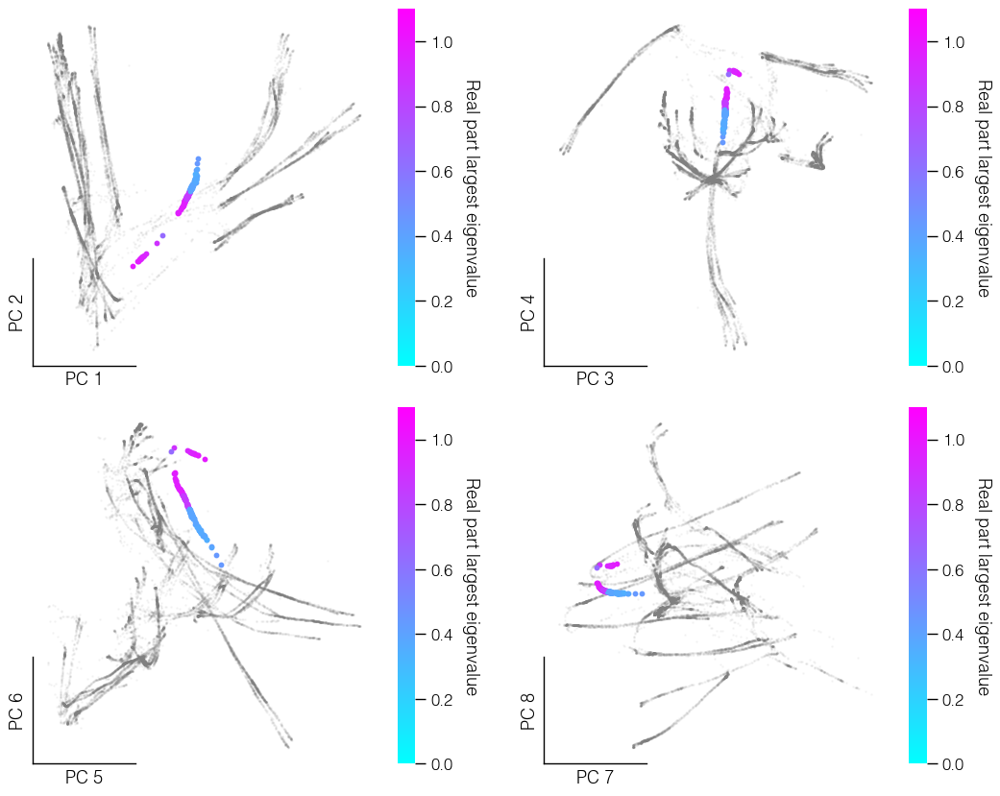

In [227]:
plot_eigenvecs_and_vals(unique_fps_high_reward_odor)
# plot_eigenval_ratio(unique_fps_high_reward_odor)

In [314]:
n_initial_states = 200
inputs = np.zeros([n_initial_states, OBS_SIZE + ACTION_SIZE + 1])
inputs[:, 0] = 1
inputs[:, 3] = 1
h_final = run_states_forward(network, inputs)

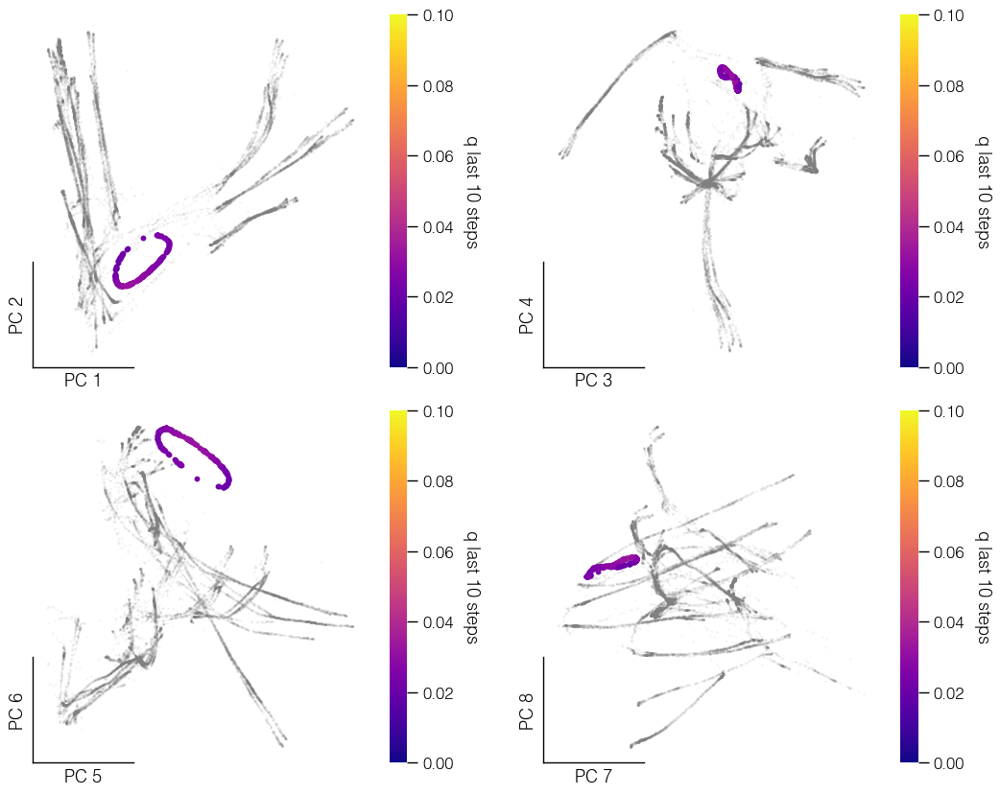

In [159]:
plot_forward_run_points(h_final, env_idx=0)

(100, 1, 128)


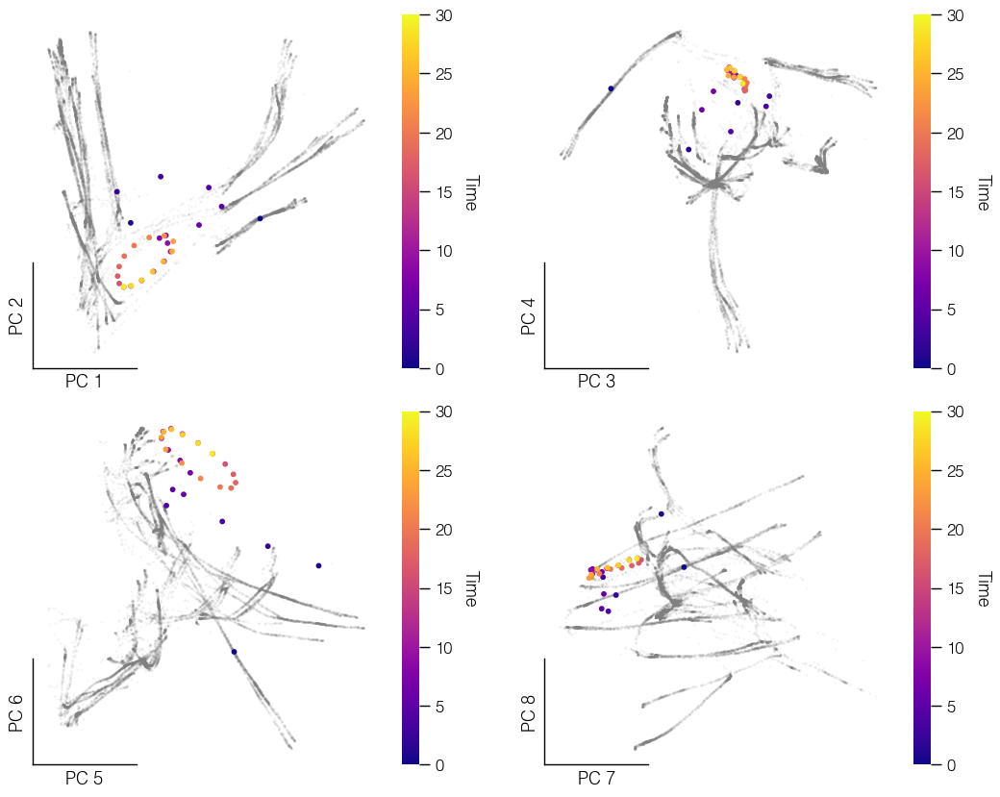

In [287]:
print(h_final[:, 0, :][:, None, :].shape)
plot_forward_run_points(h_final[:30, 0, :][:, None, :], env_idx=0, in_time=True)

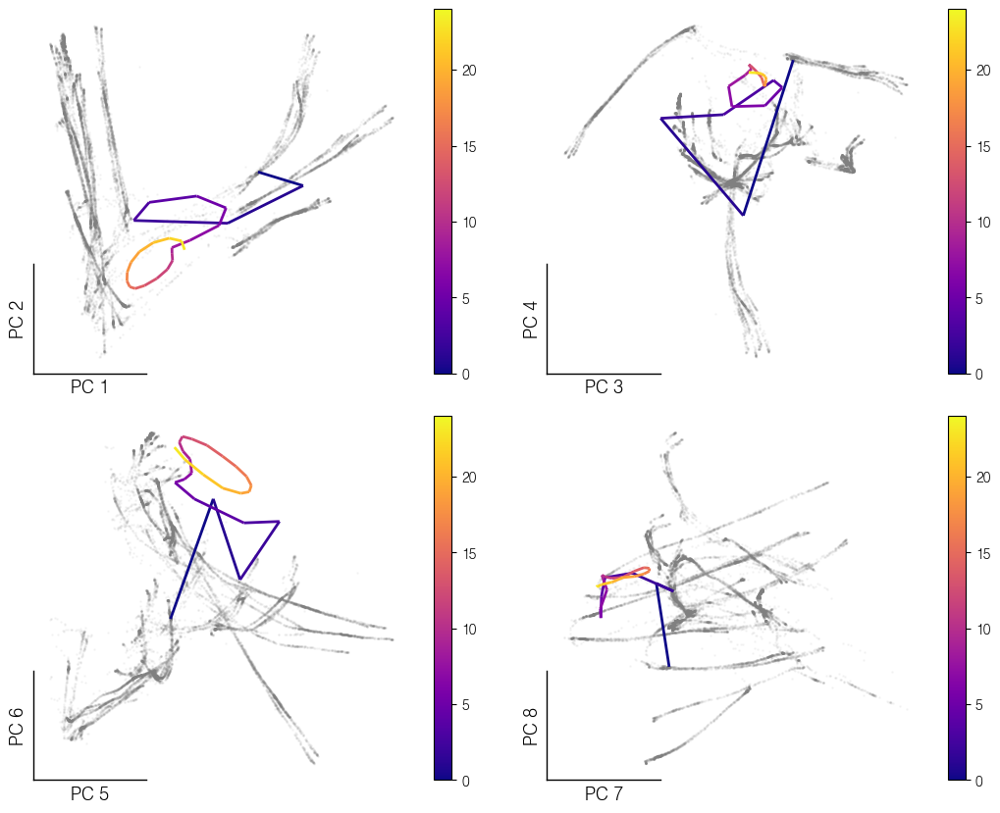

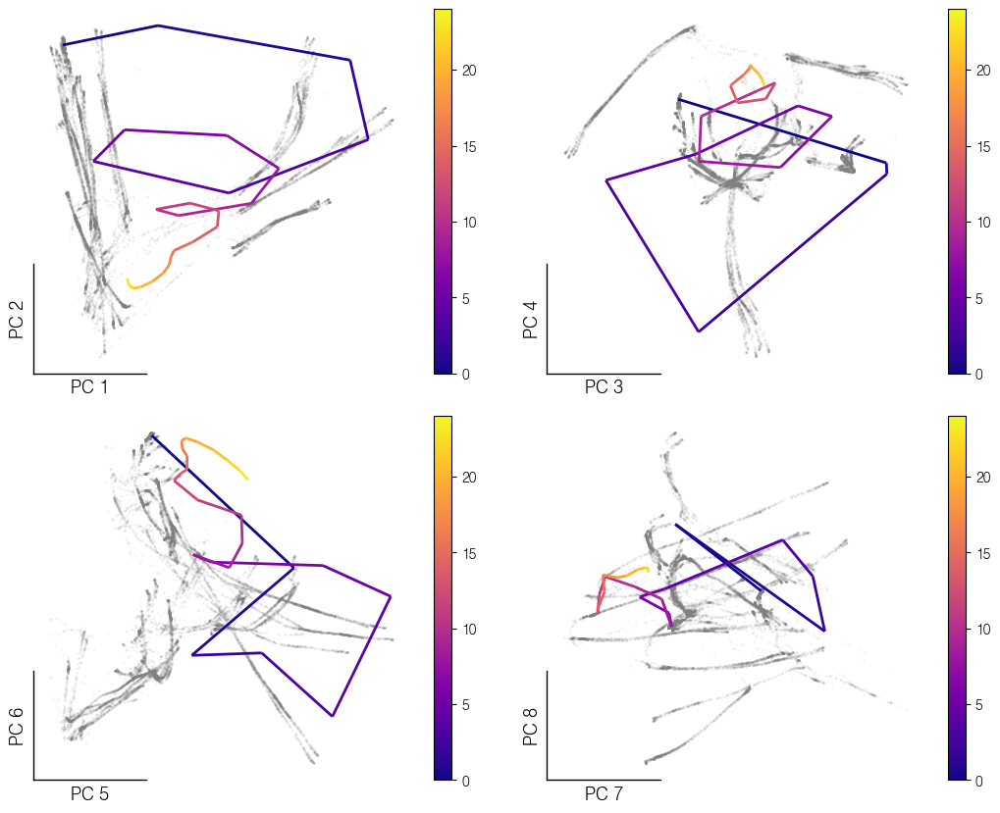

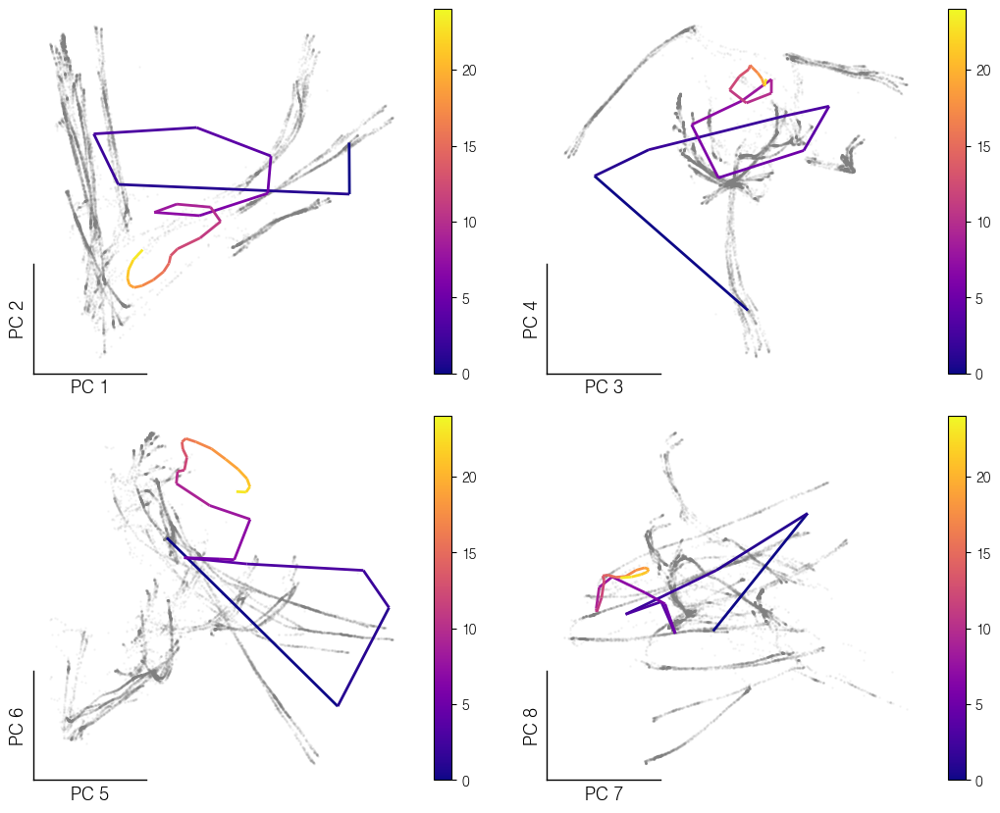

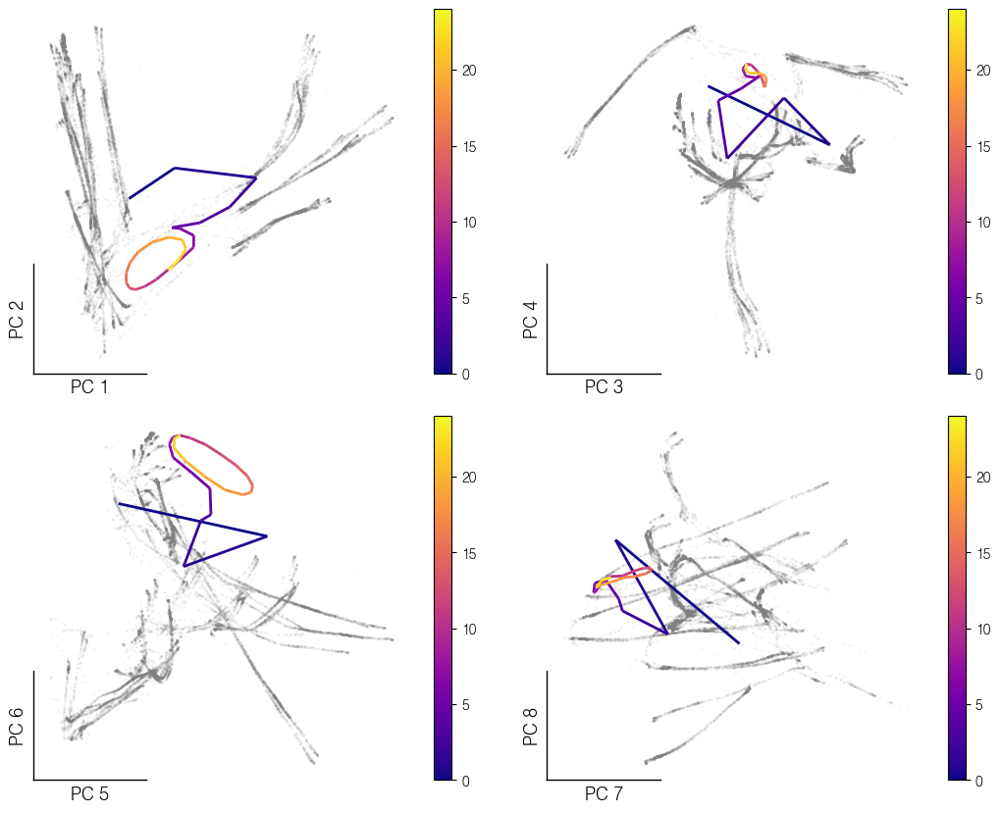

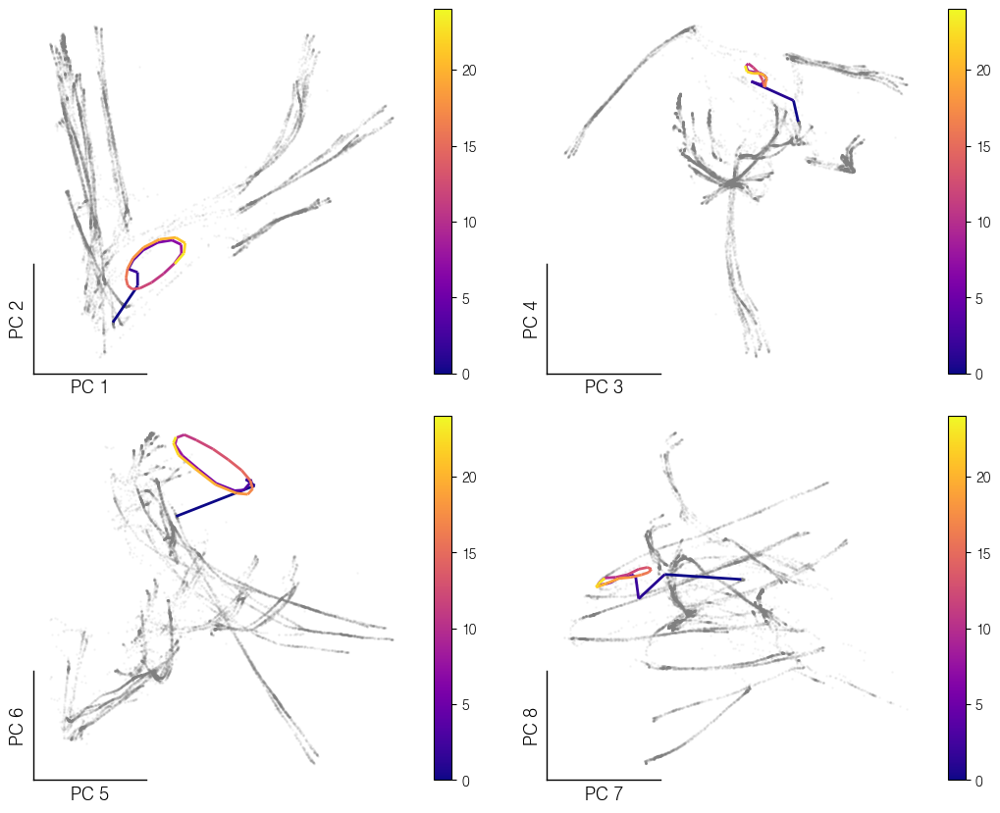

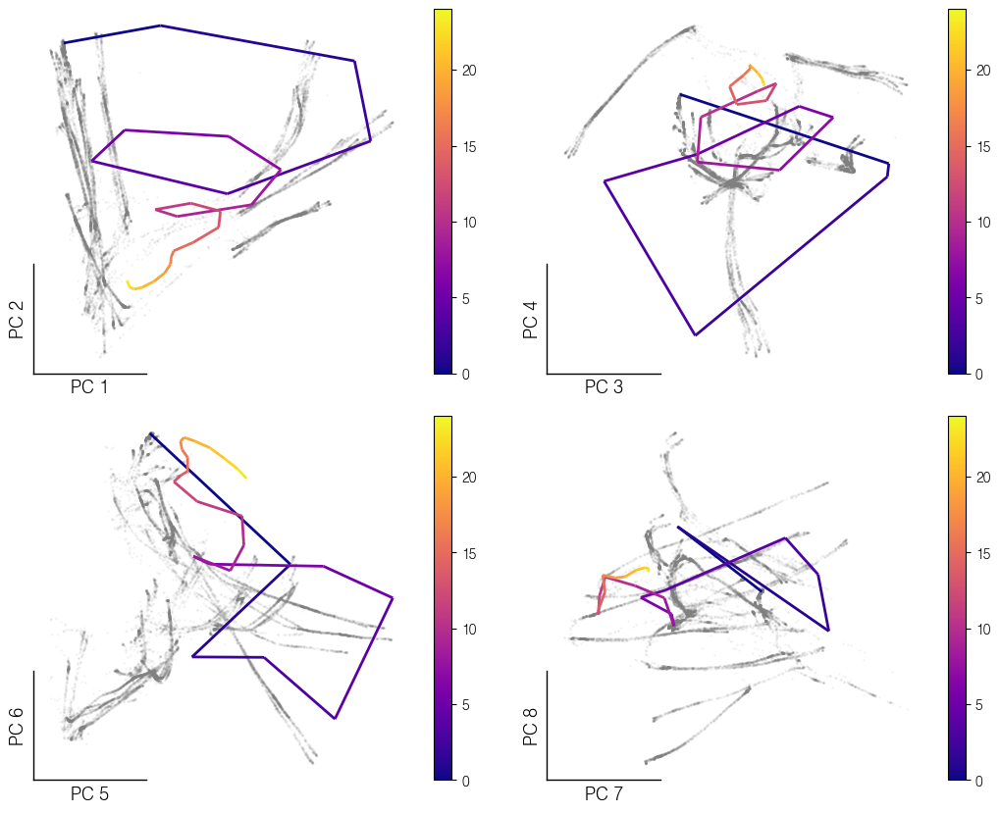

In [315]:
for j in np.arange(0, 6):
    plot_forward_run_points(h_final[:25, j, :][:, None, :], env_idx=0, in_time=True, scatter=False)

In [331]:
n_initial_states = 200
inputs = np.zeros([n_initial_states, OBS_SIZE + ACTION_SIZE + 1])
inputs[:, 5] = 1

unique_fps_run = compute_fixed_points(network, inputs, tol_q=5e-3)

	Freezing model parameters so model is not affected by fixed point optimization.
		initial_states: 0 outliers detected (of 200).
		fixed points: 0 outliers detected (of 180).
	Decomposing Jacobians in a single batch.
	Sorting by Eigenvalue magnitude.


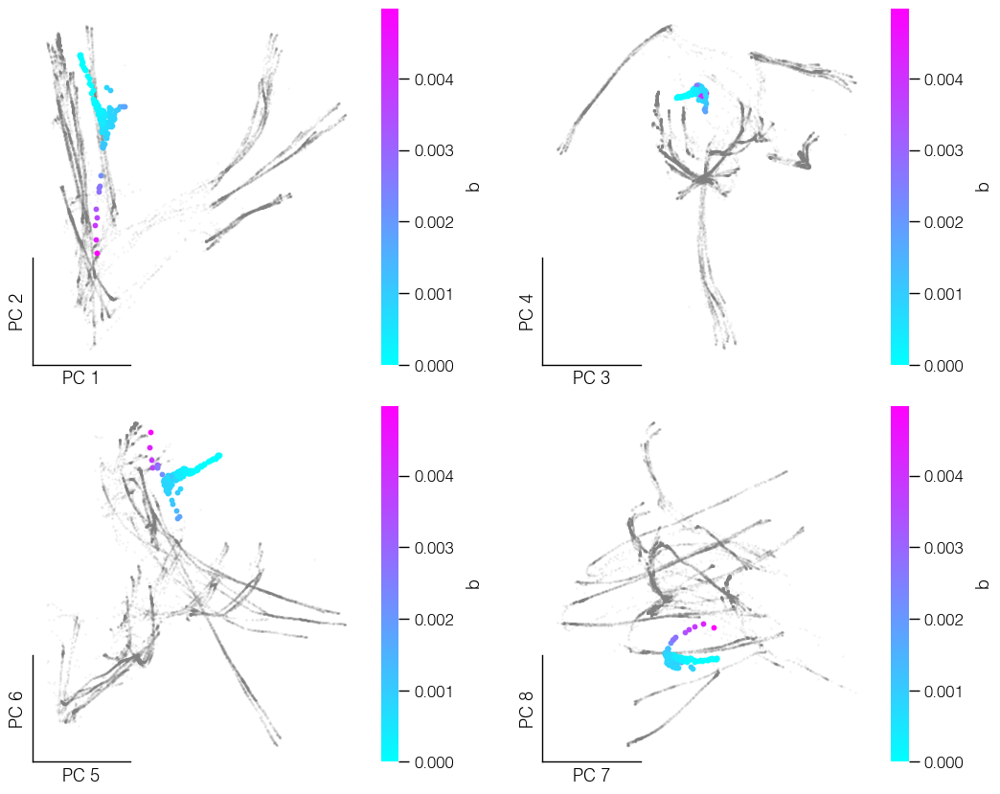

In [332]:
plot_fixed_points_with_q(unique_fps_run)

In [328]:
n_initial_states = 200
inputs = np.zeros([n_initial_states, OBS_SIZE + ACTION_SIZE + 1])
inputs[:, 5] = 1
h_final = run_states_forward(network, inputs, n=100)

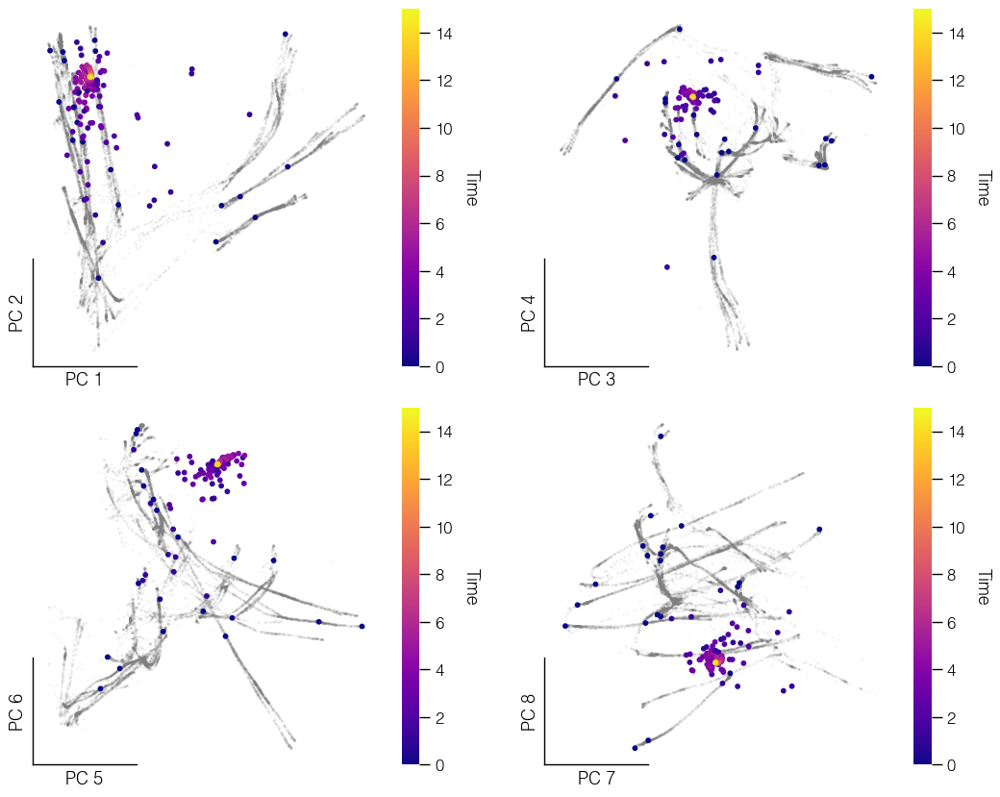

In [329]:
plot_forward_run_points(h_final[:15, :20, :], env_idx=0, in_time=True)

In [333]:
n_initial_states = 200
inputs = np.zeros([n_initial_states, OBS_SIZE + ACTION_SIZE + 1])
inputs[:, 0] = 1
inputs[:, 5] = 1

unique_fps_visual_run = compute_fixed_points(network, inputs, tol_q=5e-3)

	Freezing model parameters so model is not affected by fixed point optimization.
		initial_states: 0 outliers detected (of 200).
		fixed points: 0 outliers detected (of 191).
	Decomposing Jacobians in a single batch.
	Sorting by Eigenvalue magnitude.


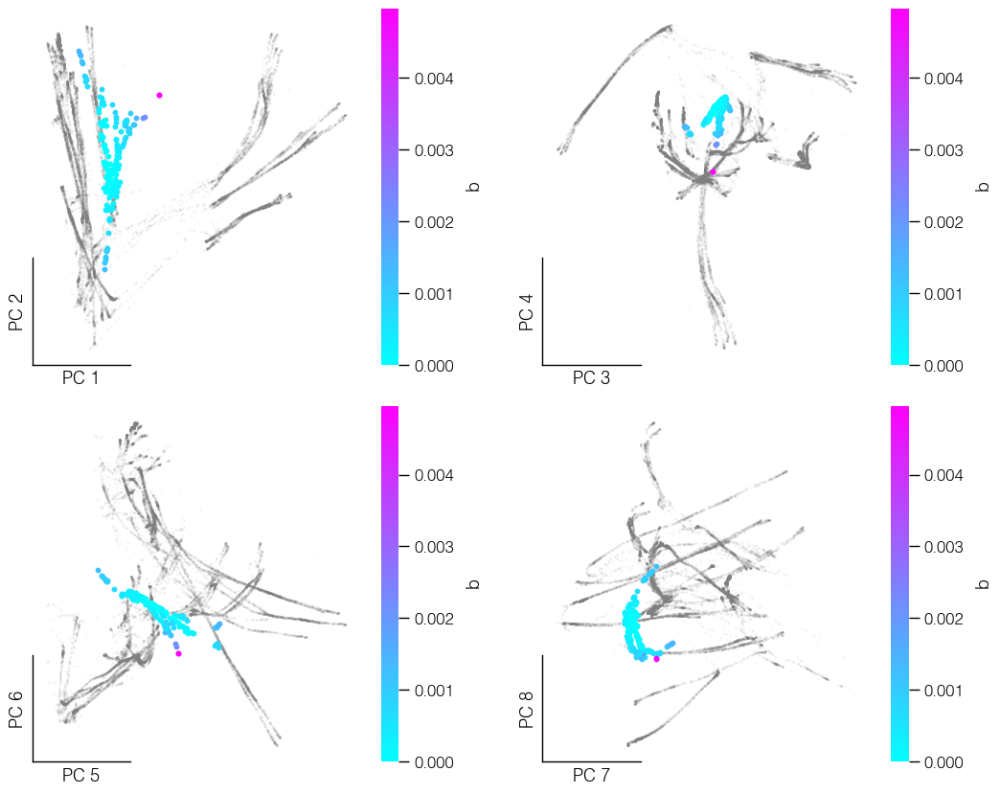

In [334]:
plot_fixed_points_with_q(unique_fps_visual_run)

In [336]:
n_initial_states = 200
inputs = np.zeros([n_initial_states, OBS_SIZE + ACTION_SIZE + 1])
inputs[:, 0] = 1
inputs[:, 5] = 1
h_final = run_states_forward(network, inputs, n=100)

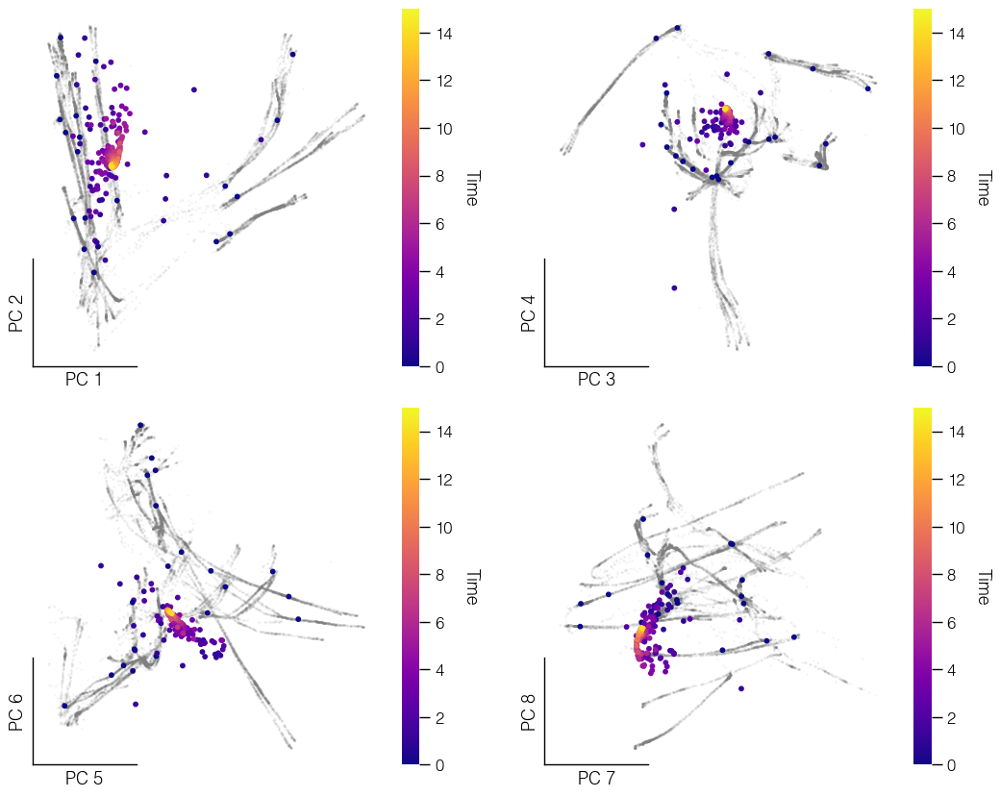

In [337]:
plot_forward_run_points(h_final[:15, :20, :], env_idx=0, in_time=True)

In [338]:
n_initial_states = 200
inputs = np.zeros([n_initial_states, OBS_SIZE + ACTION_SIZE + 1])
inputs[:, 0] = 1
inputs[:, 4] = 1

unique_fps_visual_stay = compute_fixed_points(network, inputs, tol_q=5e-3)

	Freezing model parameters so model is not affected by fixed point optimization.
		initial_states: 0 outliers detected (of 200).
		fixed points: 0 outliers detected (of 182).
	Decomposing Jacobians in a single batch.
	Sorting by Eigenvalue magnitude.


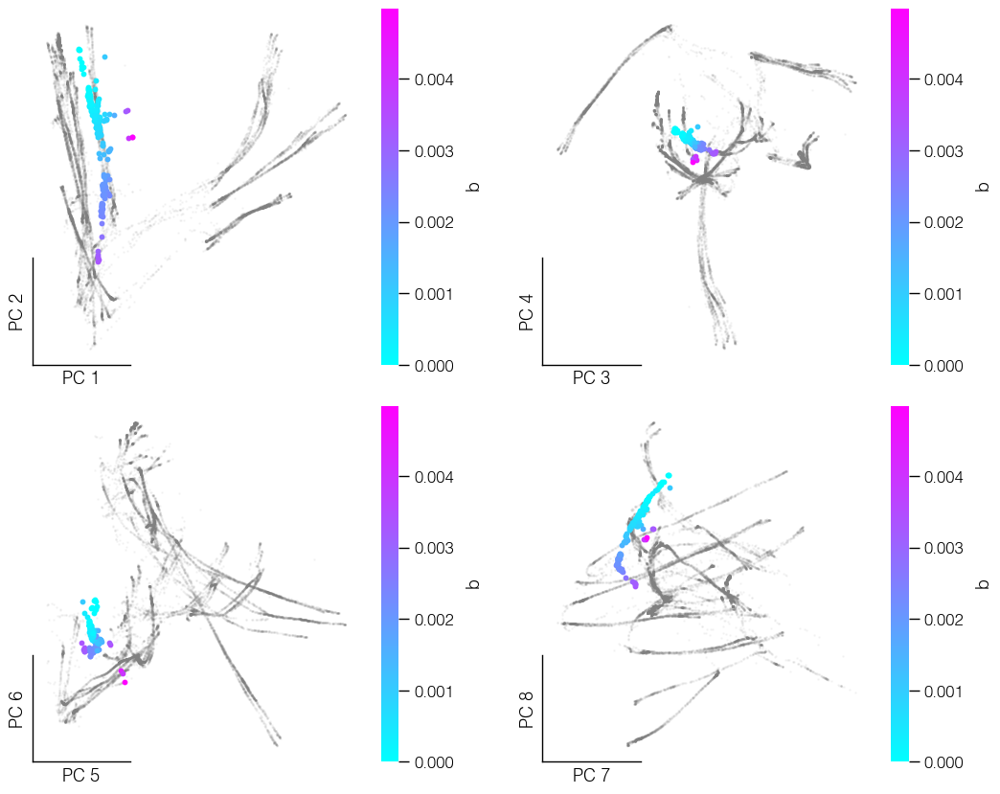

In [339]:
plot_fixed_points_with_q(unique_fps_visual_stay)

In [340]:
n_initial_states = 200
inputs = np.zeros([n_initial_states, OBS_SIZE + ACTION_SIZE + 1])
inputs[:, 0] = 1
inputs[:, 2] = 1
inputs[:, 4] = 1

unique_fps_visual_stay_low_reward = compute_fixed_points(network, inputs, tol_q=5e-3)

	Freezing model parameters so model is not affected by fixed point optimization.
		initial_states: 0 outliers detected (of 200).
		fixed points: 0 outliers detected (of 196).
	Decomposing Jacobians in a single batch.
	Sorting by Eigenvalue magnitude.


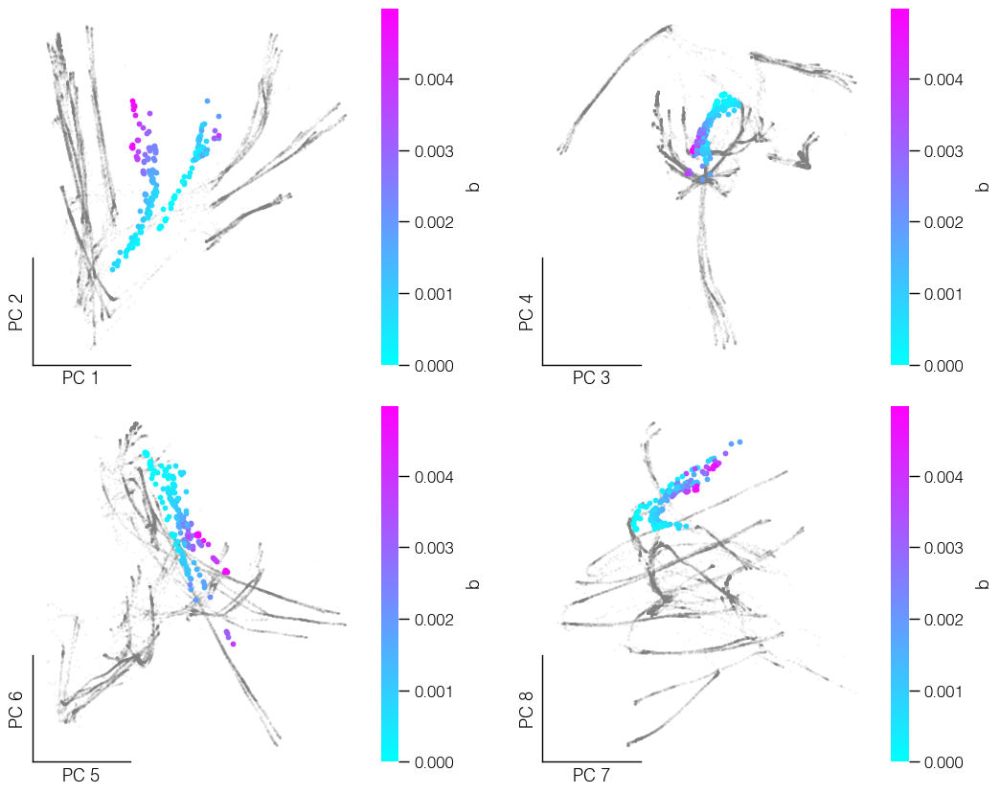

In [341]:
plot_fixed_points_with_q(unique_fps_visual_stay_low_reward)

In [346]:
n_initial_states = 200
inputs = np.zeros([n_initial_states, OBS_SIZE + ACTION_SIZE + 1])
inputs[:, 0] = 1
inputs[:, 2] = 1
inputs[:, 5] = 1

unique_fps_visual_run_low_reward = compute_fixed_points(network, inputs, tol_q=5e-3)

	Freezing model parameters so model is not affected by fixed point optimization.
		initial_states: 0 outliers detected (of 200).
		fixed points: 0 outliers detected (of 184).
	Decomposing Jacobians in a single batch.
	Sorting by Eigenvalue magnitude.


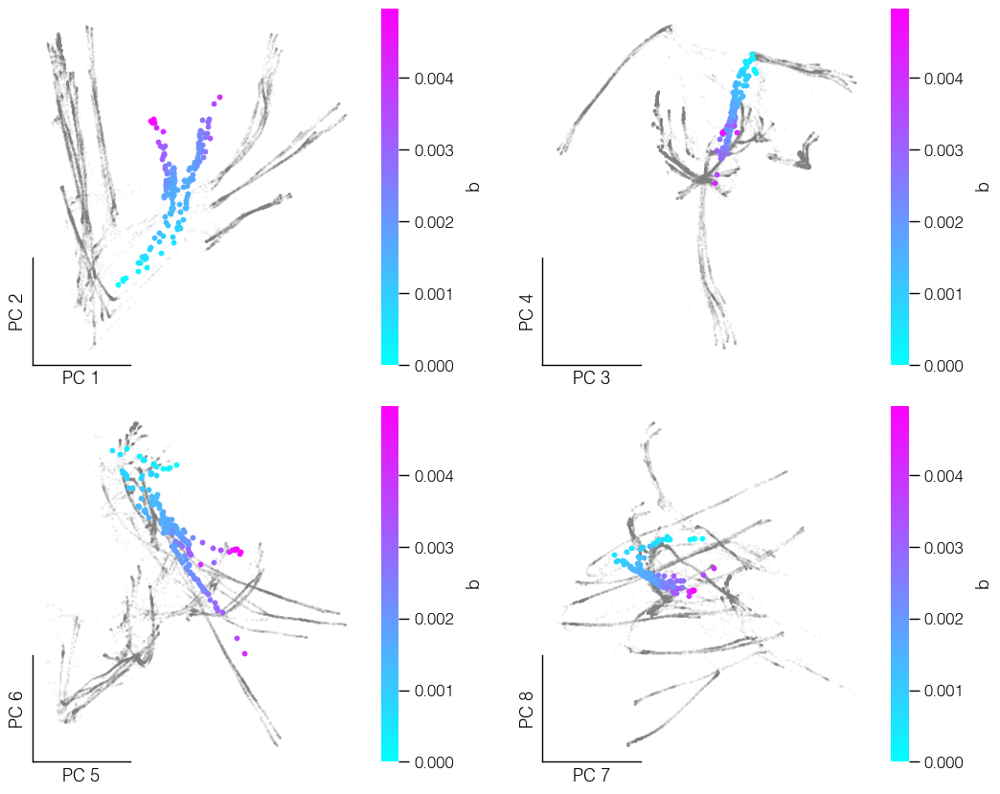

In [347]:
plot_fixed_points_with_q(unique_fps_visual_run_low_reward)

In [350]:
n_initial_states = 200
inputs = np.zeros([n_initial_states, OBS_SIZE + ACTION_SIZE + 1])
inputs[:, 0] = 1
inputs[:, 2] = 1
inputs[:, 4] = 1
inputs[:, 6] = 1

unique_fps_visual_stay_low_reward_rewarded = compute_fixed_points(network, inputs, tol_q=5e-3)

	Freezing model parameters so model is not affected by fixed point optimization.
		initial_states: 0 outliers detected (of 200).
		fixed points: 0 outliers detected (of 190).
	Decomposing Jacobians in a single batch.
	Sorting by Eigenvalue magnitude.


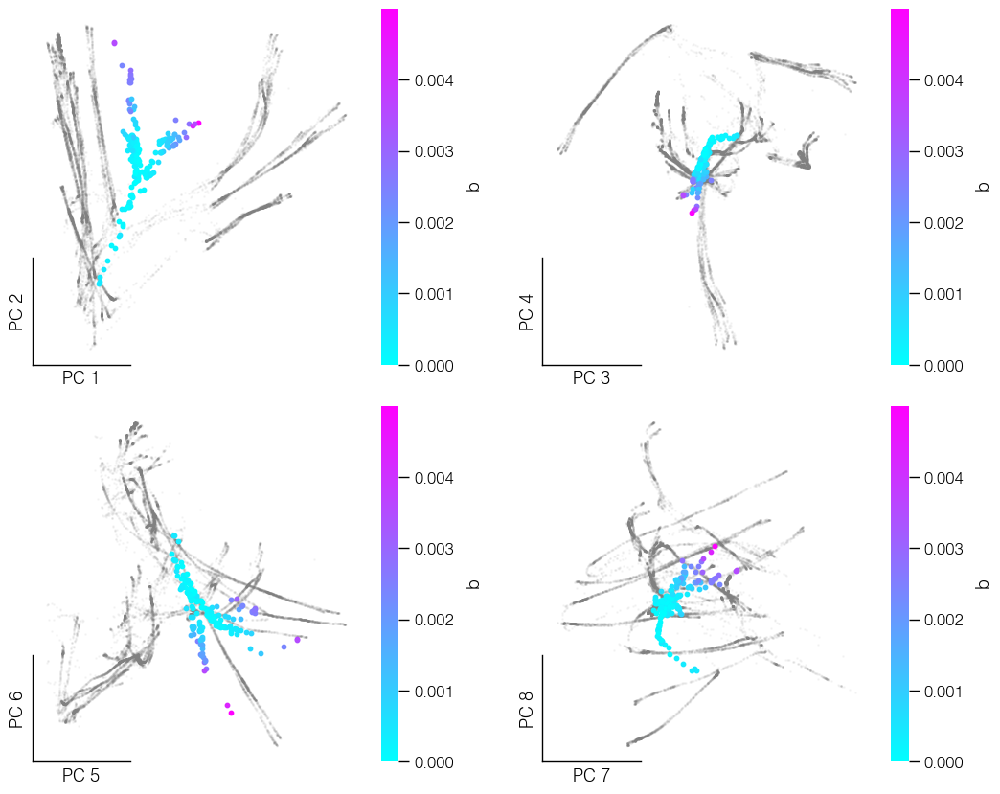

In [349]:
plot_fixed_points_with_q(unique_fps_visual_stay_low_reward)

In [342]:
n_initial_states = 200
inputs = np.zeros([n_initial_states, OBS_SIZE + ACTION_SIZE + 1])
inputs[:, 0] = 1
inputs[:, 2] = 1
inputs[:, 4] = 1
h_final = run_states_forward(network, inputs)

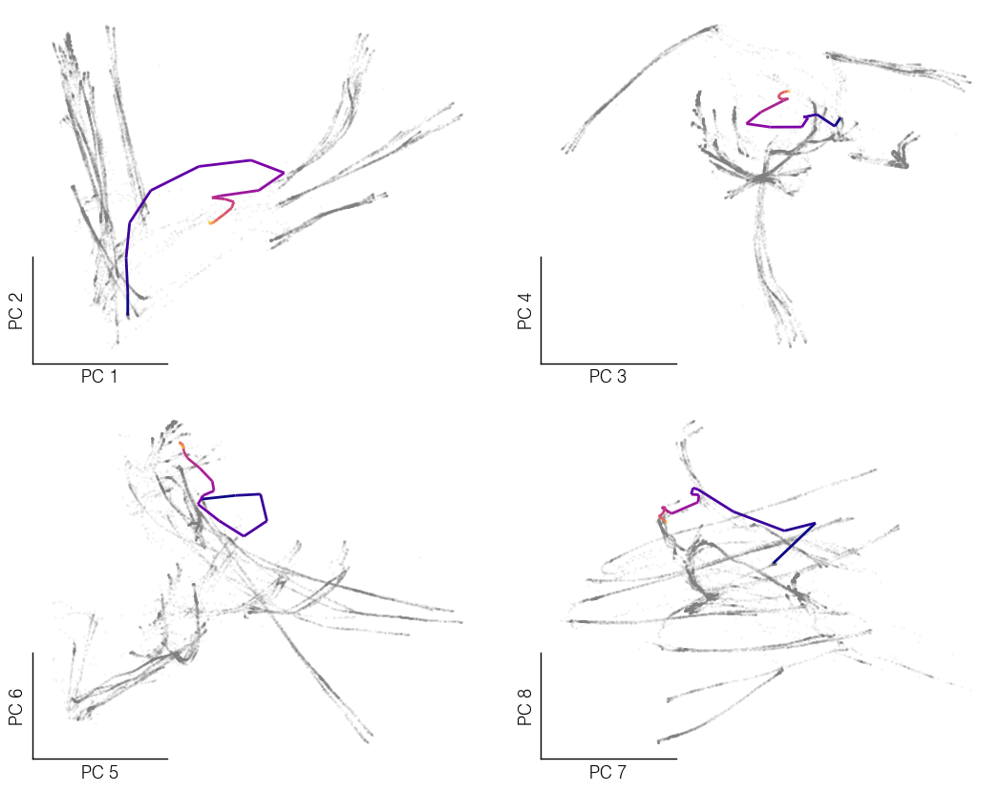

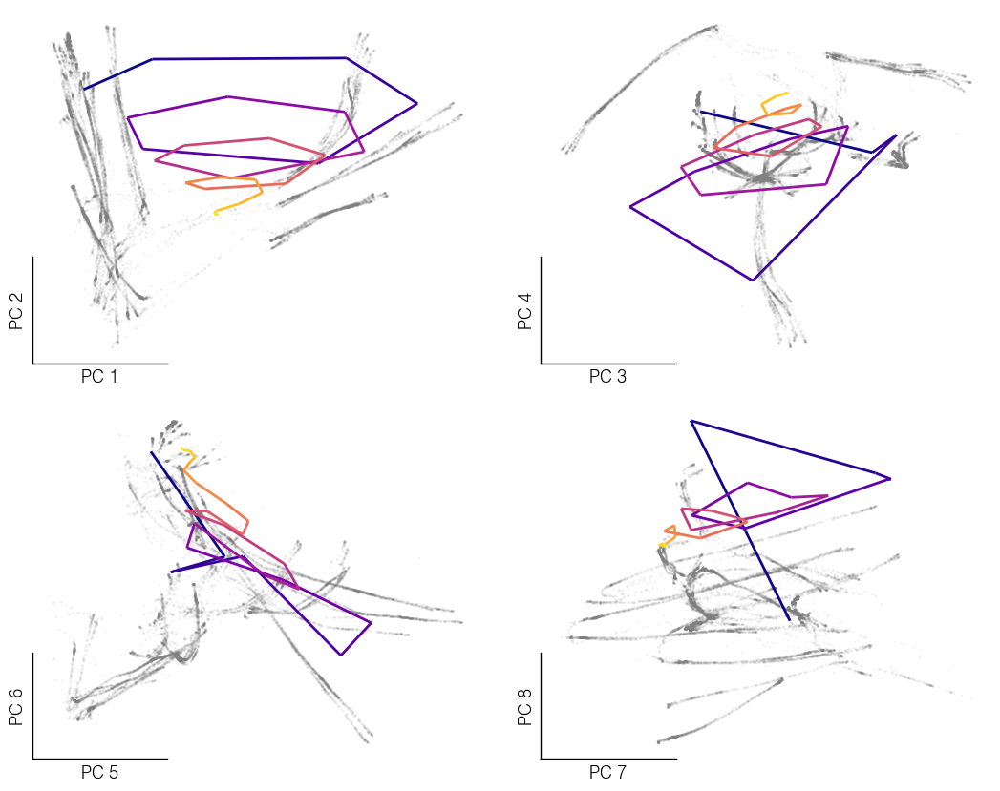

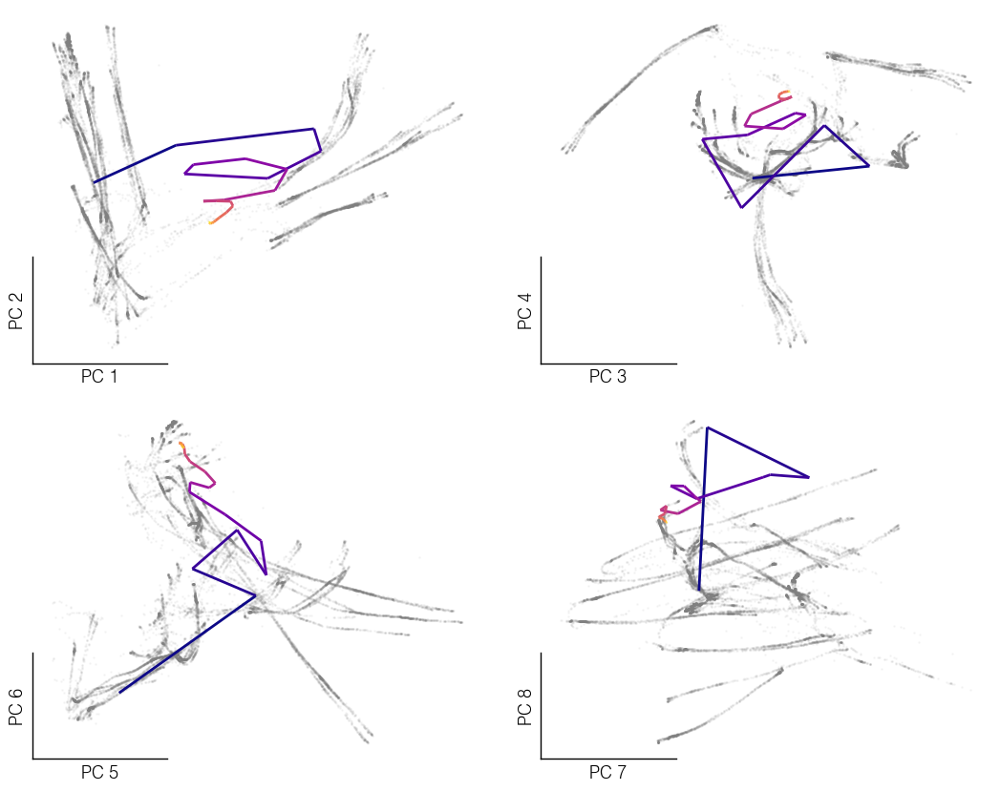

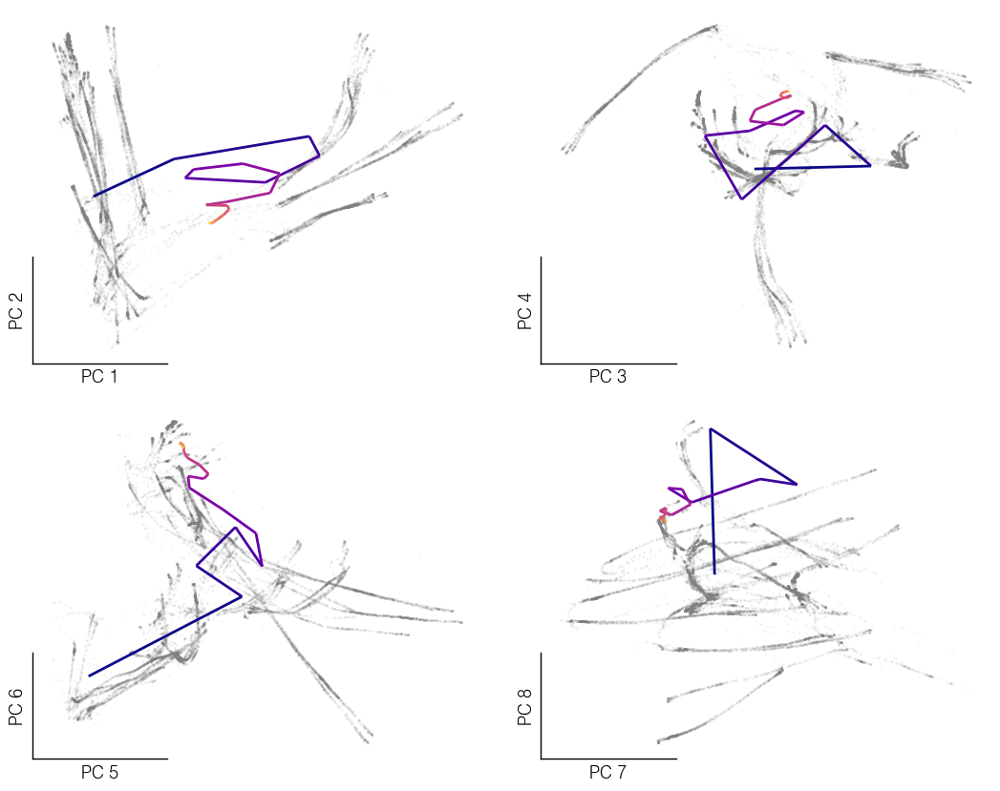

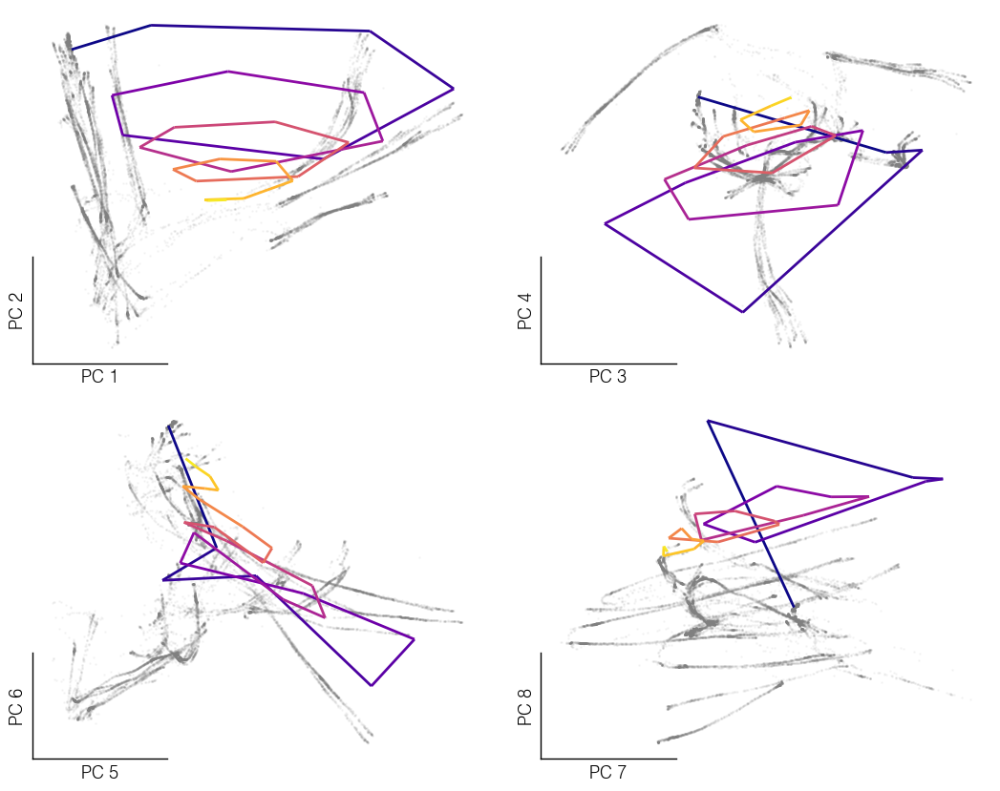

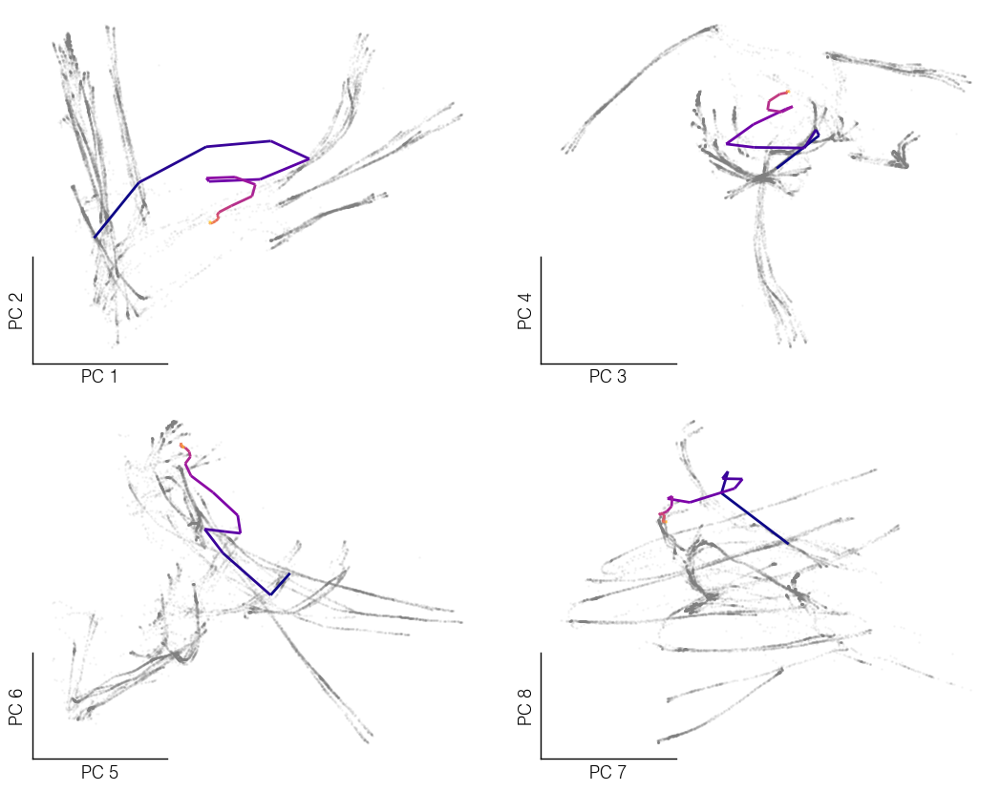

In [343]:
for j in np.arange(0, 6):
    plot_forward_run_points(h_final[:25, j, :][:, None, :], env_idx=0, in_time=True, scatter=False)

In [344]:
n_initial_states = 200
inputs = np.zeros([n_initial_states, OBS_SIZE + ACTION_SIZE + 1])
inputs[:, 0] = 1
inputs[:, 2] = 1
inputs[:, 5] = 1
h_final = run_states_forward(network, inputs)

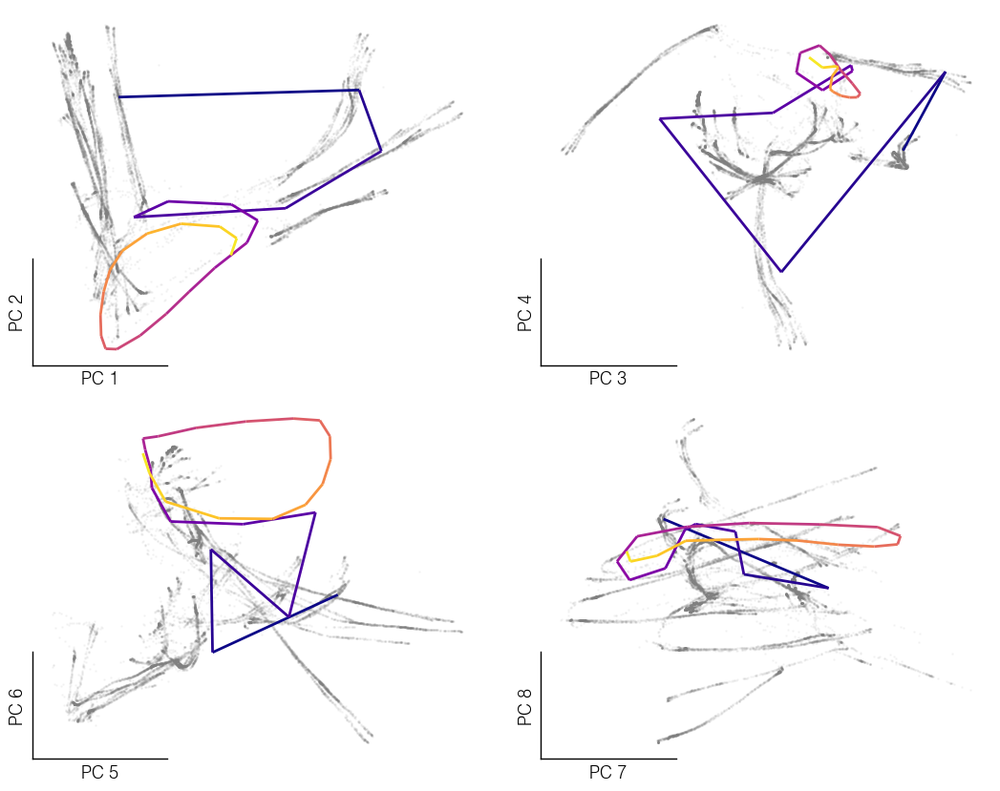

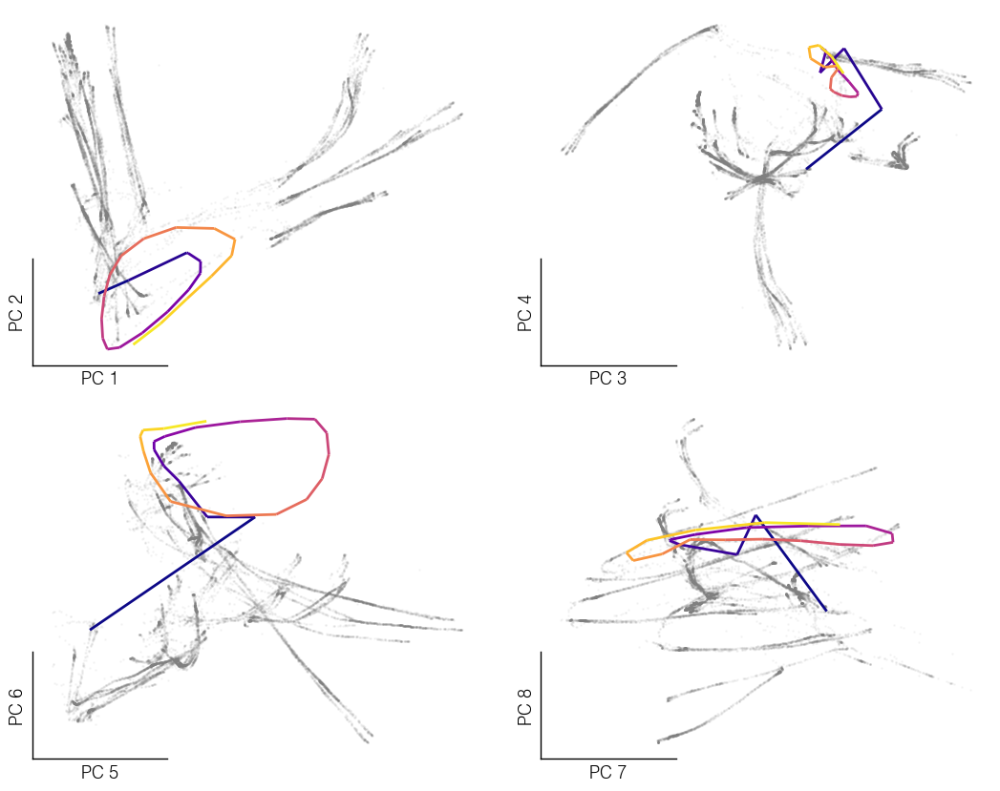

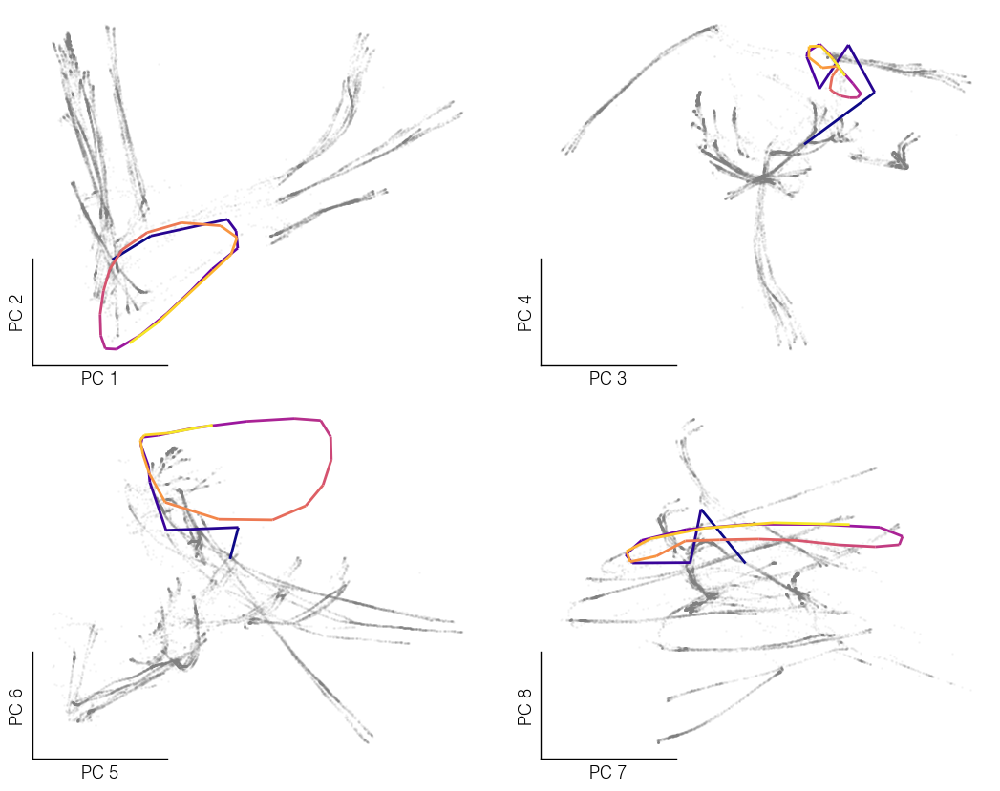

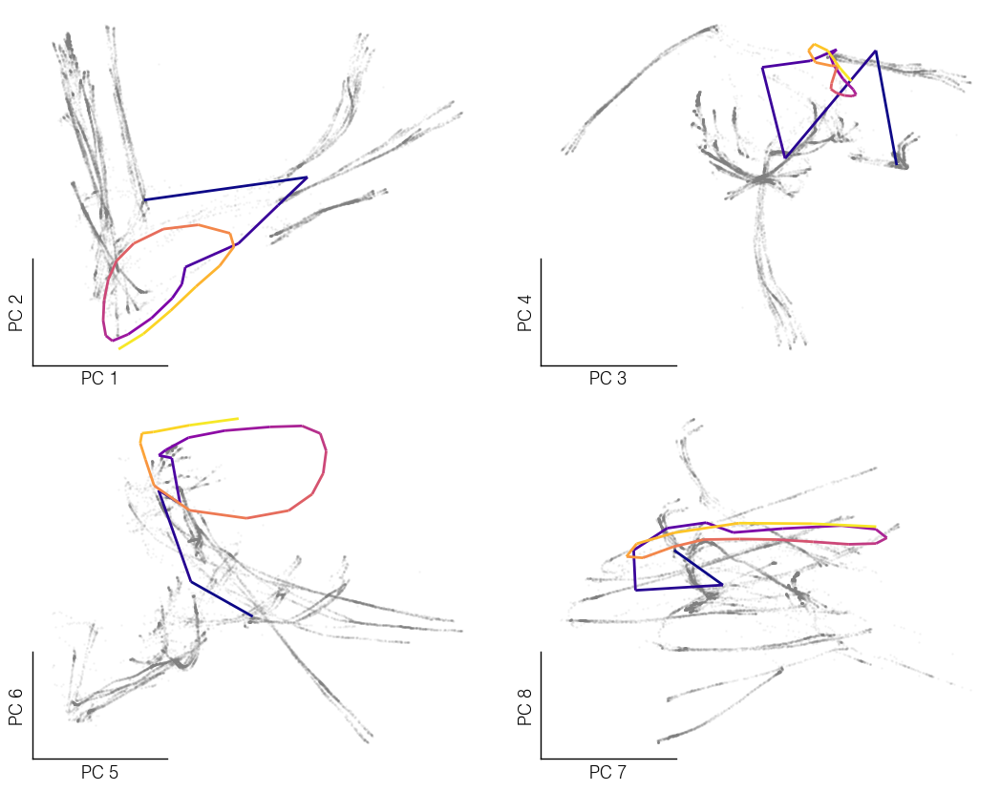

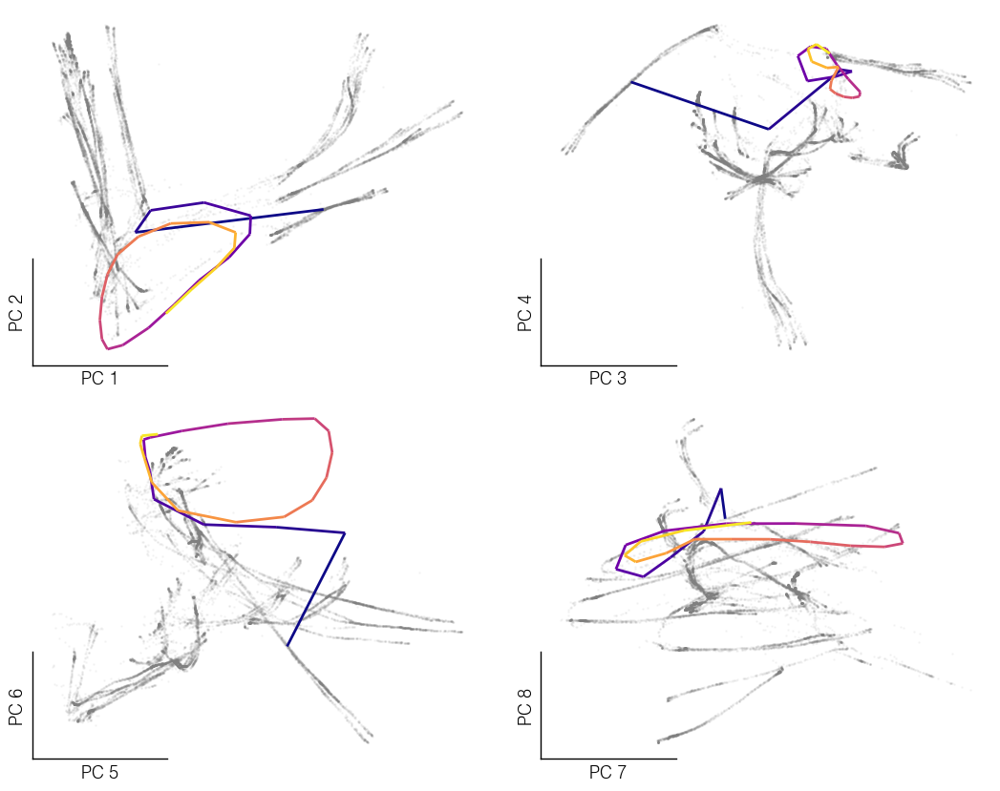

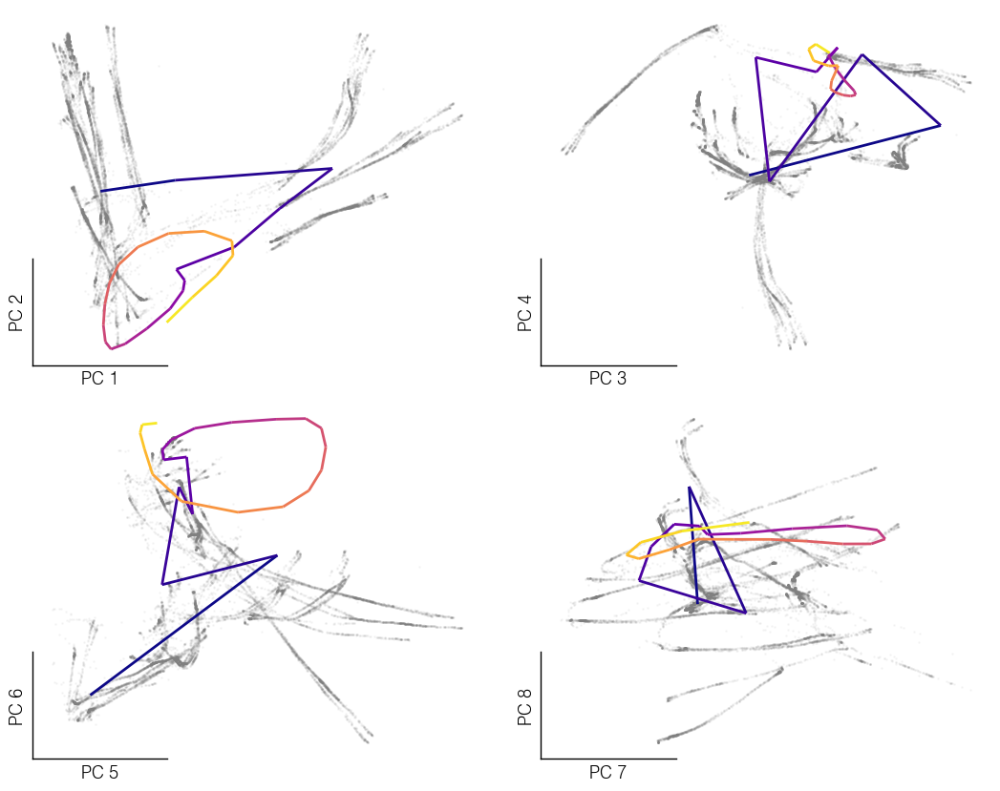

In [345]:
for j in np.arange(0, 6):
    plot_forward_run_points(h_final[:25, j, :][:, None, :], env_idx=0, in_time=True, scatter=False)

In [351]:
n_initial_states = 200
inputs = np.zeros([n_initial_states, OBS_SIZE + ACTION_SIZE + 1])
inputs[:, 0] = 1
inputs[:, 2] = 1
inputs[:, 4] = 1
inputs[:, 6] = 1
h_final = run_states_forward(network, inputs)

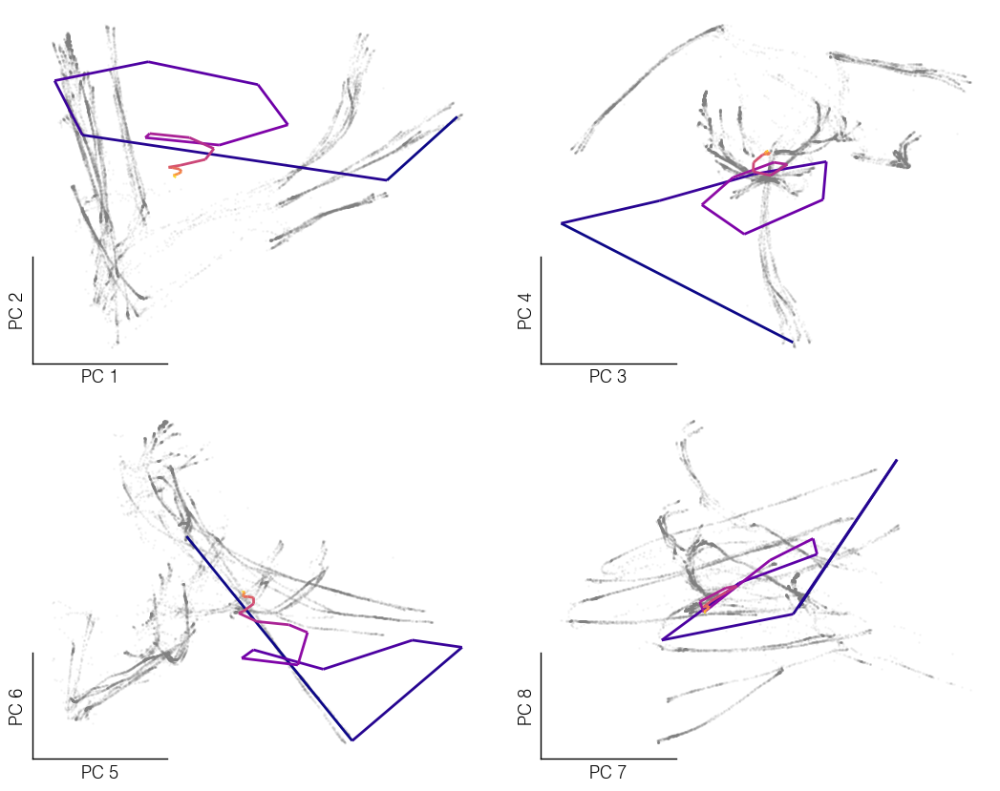

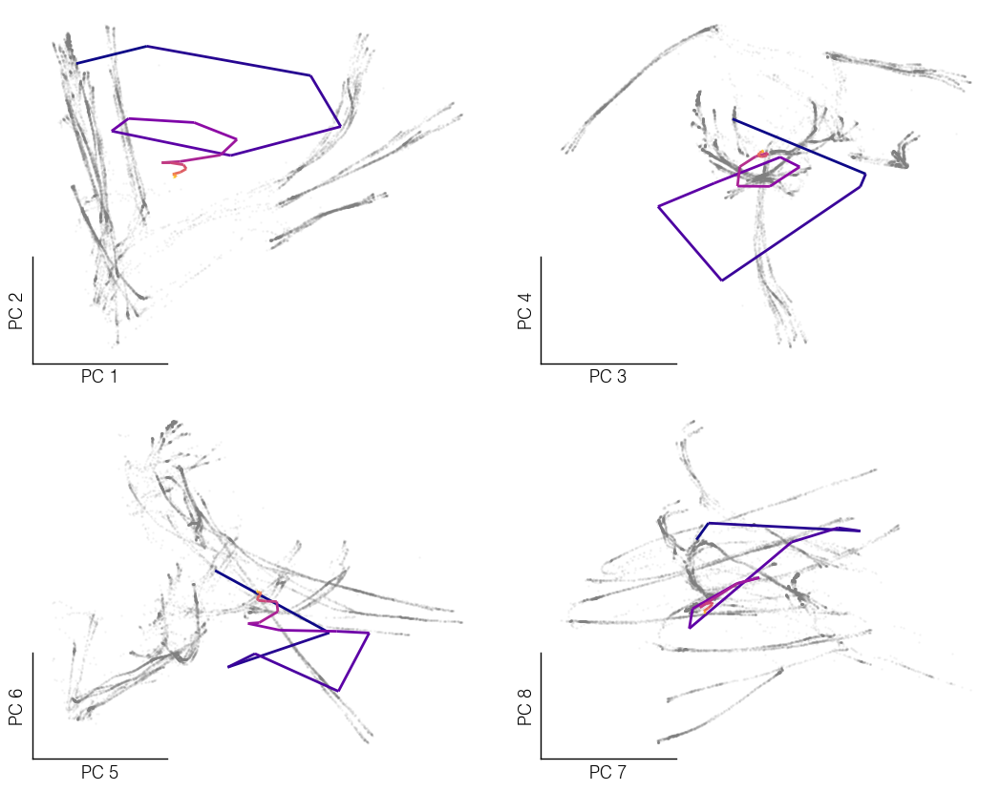

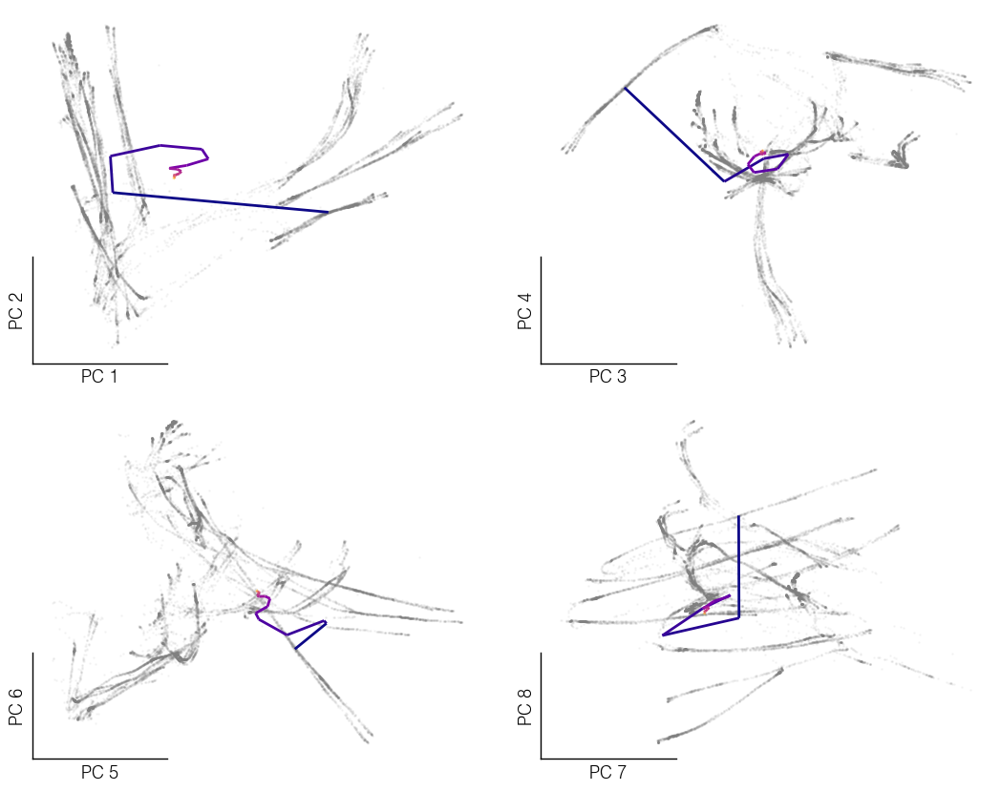

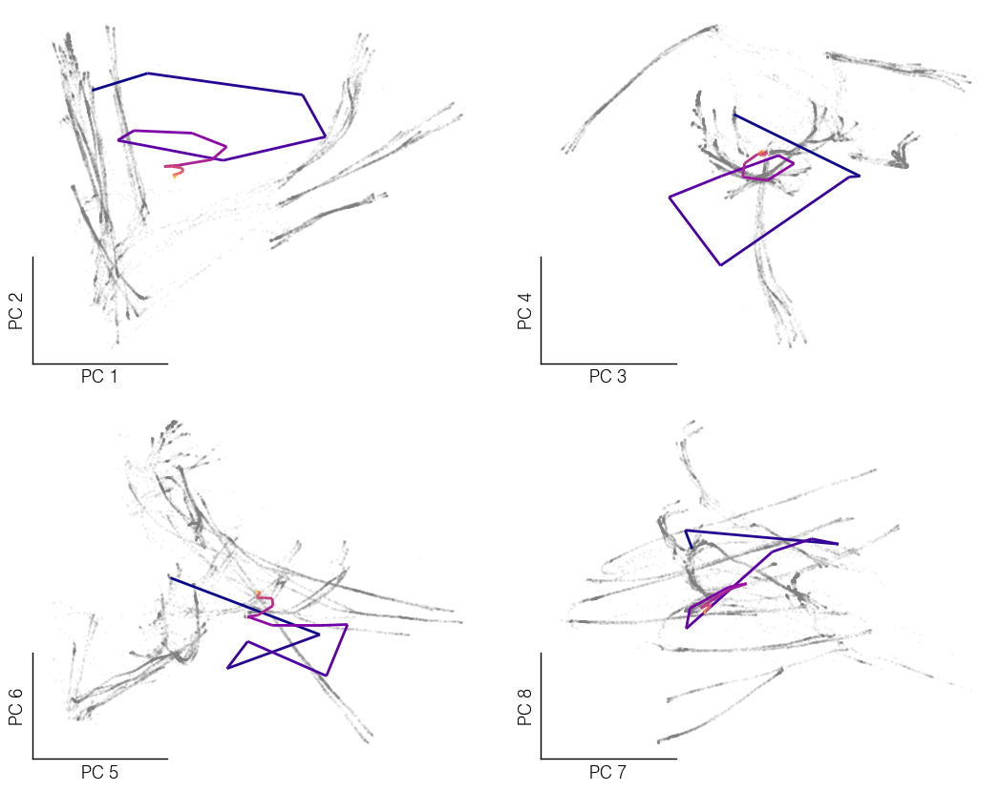

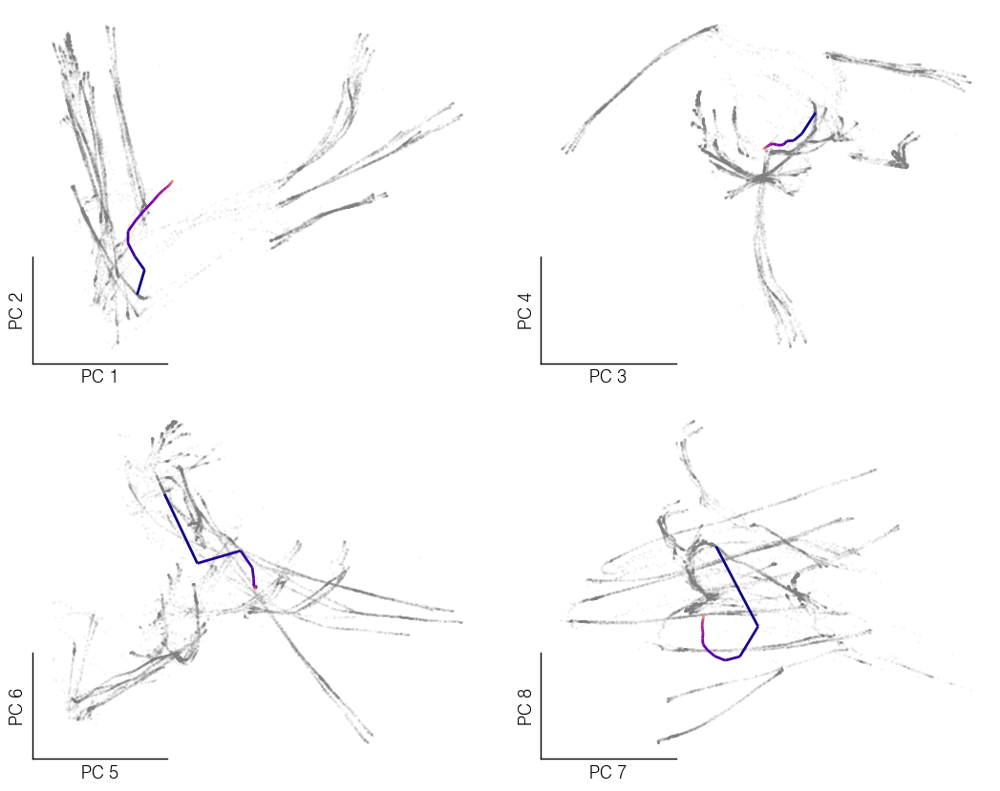

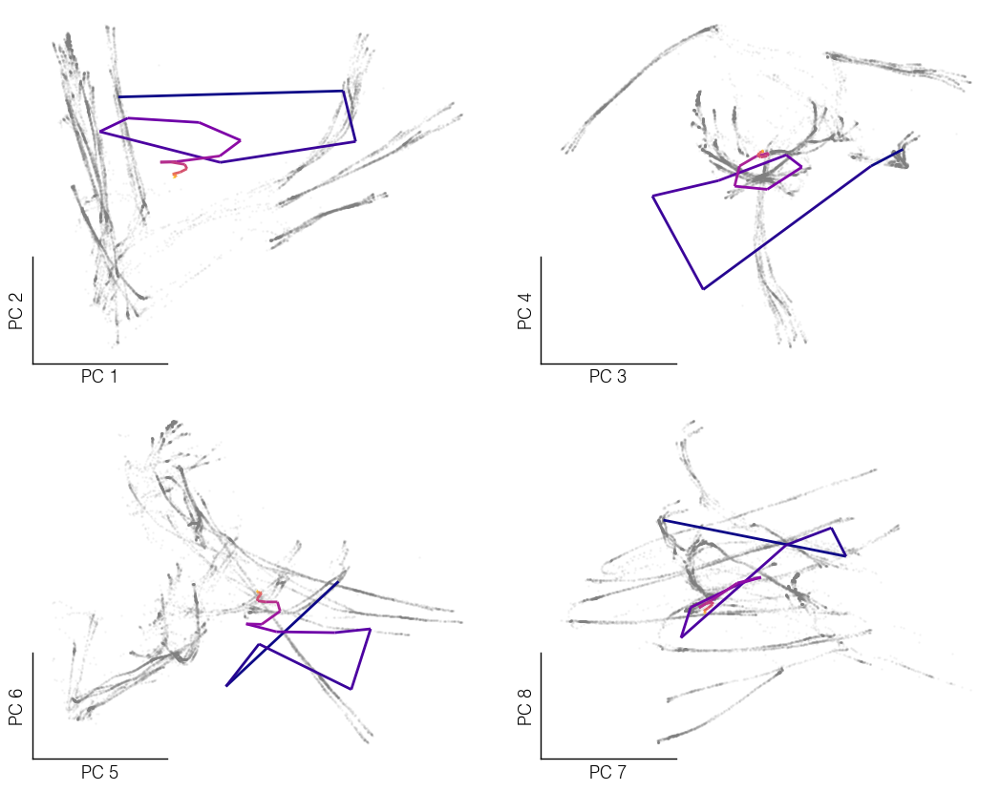

In [352]:
for j in np.arange(0, 6):
    plot_forward_run_points(h_final[:25, j, :][:, None, :], env_idx=0, in_time=True, scatter=False)

	Freezing model parameters so model is not affected by fixed point optimization.
		initial_states: 0 outliers detected (of 200).
		fixed points: 0 outliers detected (of 186).
	Decomposing Jacobians in a single batch.
	Sorting by Eigenvalue magnitude.
	Freezing model parameters so model is not affected by fixed point optimization.
		initial_states: 0 outliers detected (of 200).
		fixed points: 0 outliers detected (of 186).
	Decomposing Jacobians in a single batch.
	Sorting by Eigenvalue magnitude.
	Freezing model parameters so model is not affected by fixed point optimization.
		initial_states: 0 outliers detected (of 200).
		fixed points: 0 outliers detected (of 194).
	Decomposing Jacobians in a single batch.
	Sorting by Eigenvalue magnitude.
	Freezing model parameters so model is not affected by fixed point optimization.
		initial_states: 0 outliers detected (of 200).
		fixed points: 0 outliers detected (of 194).
	Decomposing Jacobians in a single batch.
	Sorting by Eigenvalue magnitu

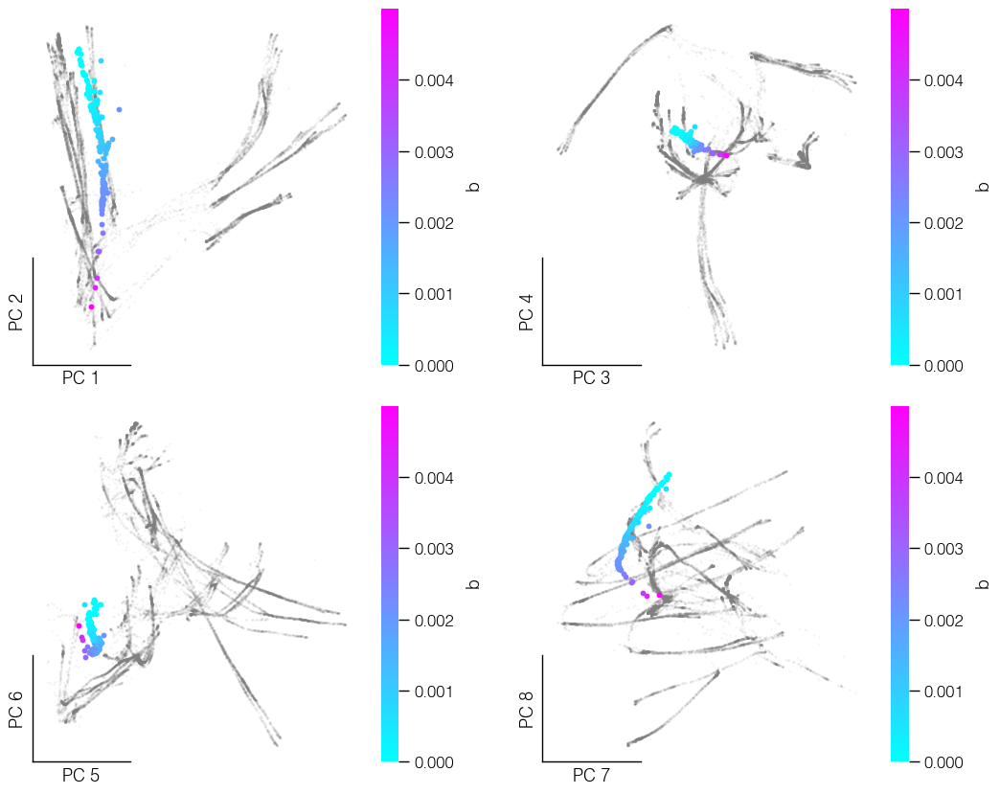

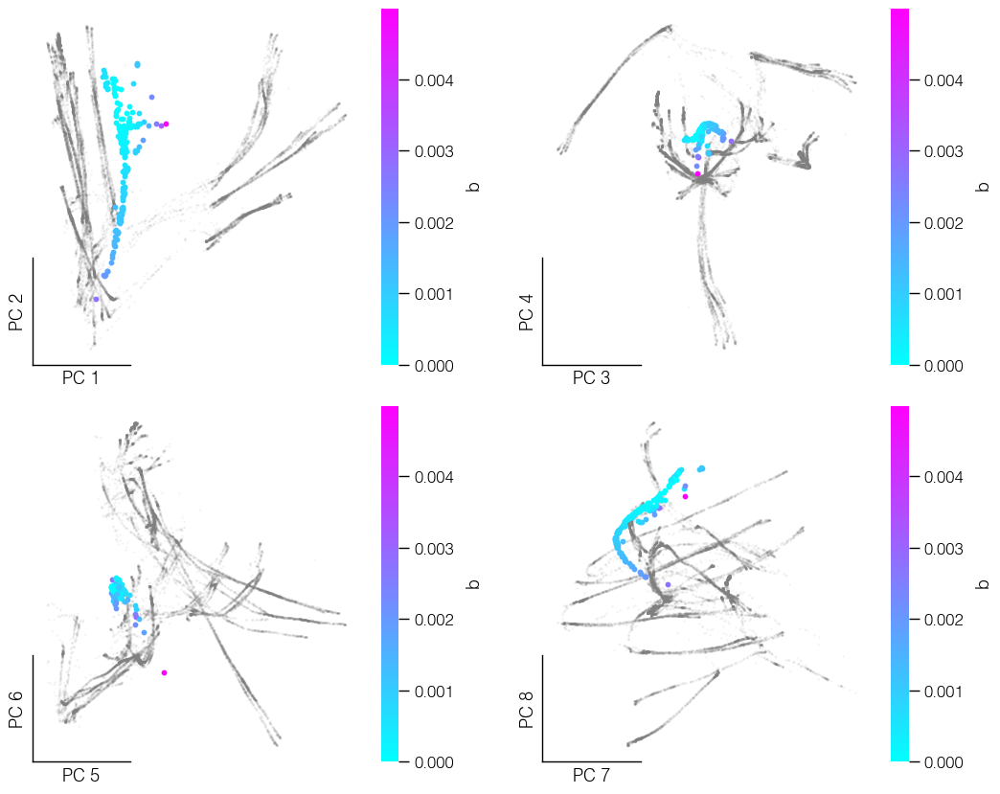

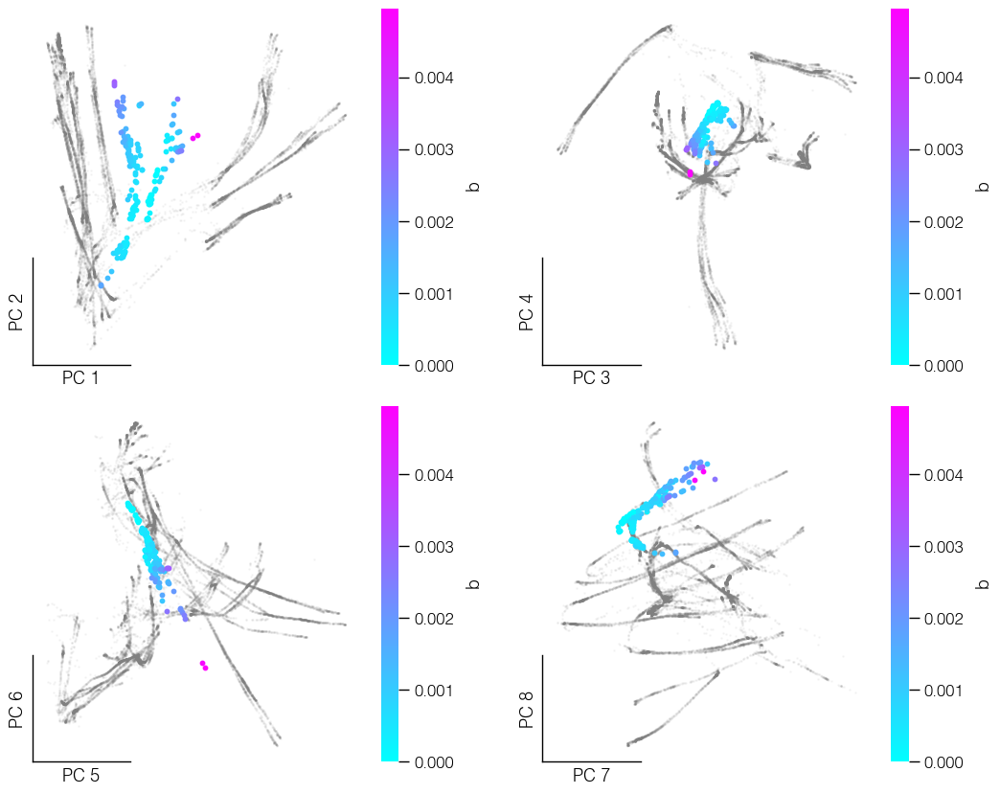

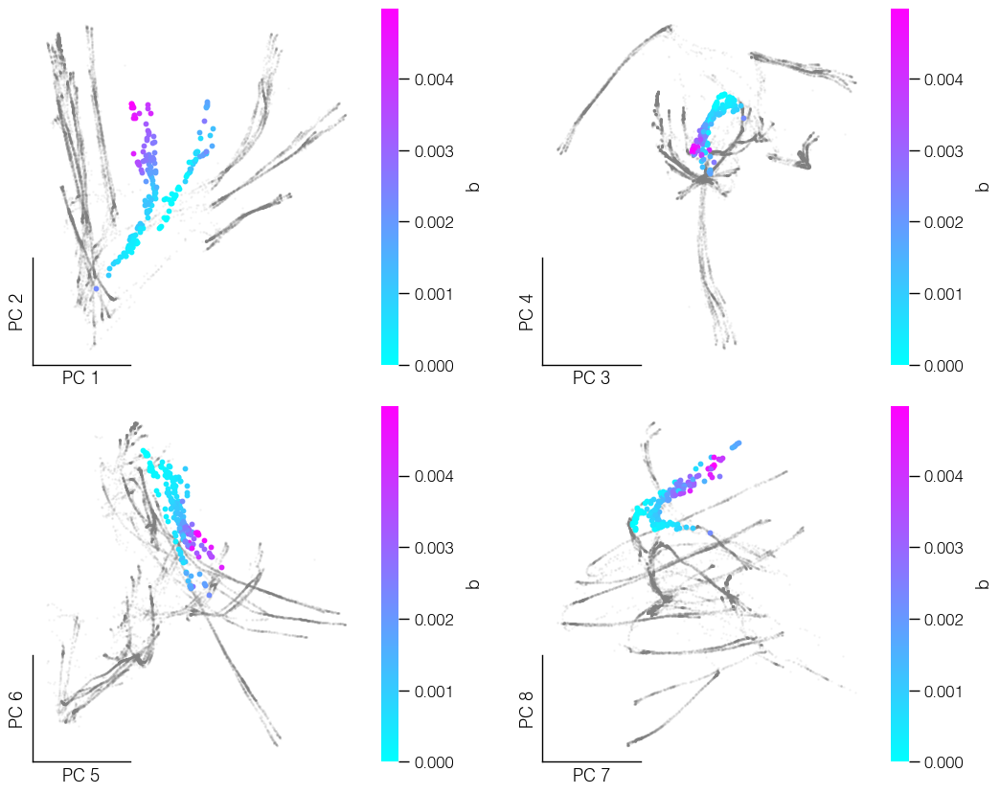

In [357]:
for l in np.linspace(0, 1, 4):
    n_initial_states = 200
    inputs = np.zeros([n_initial_states, OBS_SIZE + ACTION_SIZE + 1])
    inputs[:, 0] = 1
    inputs[:, 4] = 1
    inputs[:, 2] = l
    
    unique_fps_visual_stay_transition = compute_fixed_points(network, inputs, tol_q=5e-3)
    plot_fixed_points_with_q(unique_fps_visual_stay_transition)

In [68]:
def extract_states_for_val(hidden_activities, all_session_data, var, in_patch=False):
    vals = np.arange(16)
    states_for_each_val = [[] for x in vals]
    for env_i in range(len(all_session_data)):
        session_data = all_session_data[env_i]
        for i_v, val in enumerate(vals):
            in_patch_mask = session_data['agent_in_patch'] == 1
            mask = logical_and(in_patch_mask, session_data[var] == val)
            hidden_for_mask = hidden_activities[:, env_i, mask].mean(axis=-1)
            states_for_each_val[i_v].append(hidden_for_mask)
    return states_for_each_val

In [70]:
states_for_each_val = extract_states_for_val(hidden_activities, all_session_data, 'rewards_seen_in_patch')

Text(0.5, 1.0, 'Avg. unit activity as function of acc. reward')

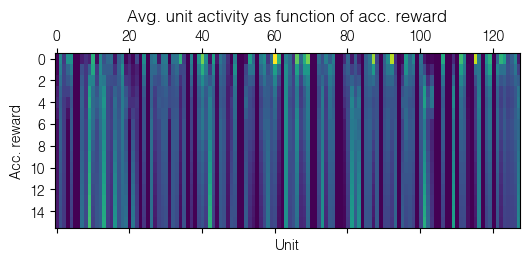

In [71]:
scale = 3
fig, axs = plt.subplots(1, 1, figsize=(2 * scale, 2 * scale))
state_rep = np.stack([np.stack(s).mean(axis=0) for s in states_for_each_val])
axs.matshow(state_rep, aspect=3)
axs.set_xlabel('Unit')
axs.set_ylabel('Acc. reward')
axs.set_title('Avg. unit activity as function of acc. reward')

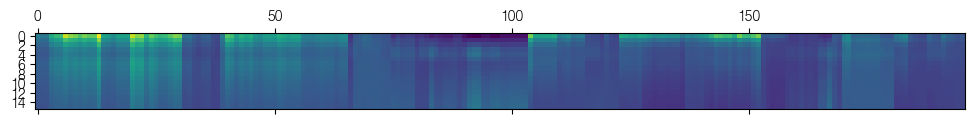

In [82]:
scale = 6
fig, axs = plt.subplots(1, 1, figsize=(2 * scale, 2 * scale))
axs.matshow(np.dot(state_rep, ordered_fps.T))